
Звук, это распространение колебаний в среде. Такое колебания можно разложить в ряд Фурье, те представить его в виде гармонических волн определенных частот. Т.е. любой звук можно разложить в ряд Фурье и описать звуковую дорожку, как некоторую комбинацию частот гармонических колебаний с определенными значениями амплитуд. Можно также сделать прямое преобразование Фурье $$f^{'}(w)=\frac{1}{2\Pi}\int f(t) exp(-iwt) dt $$ $где f^{'}$-амплитуда каждой гармоники. Если дискритизировать звуковую волну и для каждой сделать разложение в ряд Фурье, то можно представить это в виде спектрограммы.



Перед тем, как искать статью по конкретной тематике и модели, которая с ней работает. Я наткнулся на статьи:
* [Обзорная статья](https://towardsdatascience.com/audio-deep-learning-made-simple-part-1-state-of-the-art-techniques-da1d3dff2504
)

* An Ensemble of Convolutional Neural Networks for Audio

В данных статьях описаны несколько способов преобразовать звук для дальнейшей работы с ним. Зависимость ампитуды сигнала во времени не даст нам много информации. Можно использовать спектрограммы. В каждый момент времени можно реализовать прямое преобразование Фурье, получить зависимость амплитуды каждой гармонической волны от частоты.

***Spectrograms***

* Spectrograms: Получается в результате дискритизированного разложение сигнала в ряд Фурье: на горизонтальной оси представлено время, по вертикальной оси — частота в герцах; третье измерение с указанием амплитуды на определенной частоте в конкретный момент времени представлено интенсивностью.

*   Mel spectrograms: Использование шкалы децибел $10 lg \frac{P1}{P2}$ вместо привычной линейной шкалы амплитуды. Использование децибелов обусловлено человеской способность воспренимать звук. Ощущение громкости звука пропорционально логарифму его интенсивности. При обучении модели используется таже идея. При увеличении децибел в 10 раз означает увелечение интенсивности волны в 10 раз. (Интенсивность- ск. физ. вел., равная энергии переносимой волной за ед. времени на ед. площадку)


*   Mel Frequency Cepstral Coefficients: основная идея похожа на MS, но частоты разбивается на те диаппазоны, на которых обычно говорят люди. Данный способ показывает лучший результат, как можно догодаться, при работе с человеческой речью.


Существует еще несколько различных представлений спектрограмм, некоторые из которых можно посмотреть в статье An Ensemble of Convolutional Neural Networks for Audio
Classification. Но данная же работа посвящена довольно хорошо интерпритируемым и часто встречаемым представлениям: MS, MFCC. Простые S, как мне кажется, используются реже, но они также будут рассмотрены в рамках данной работы.

 ***Существует несколько различных дискретных реобразований Фурье:***
* Fast Fourier Transform - данный алгоритм работает быстрее, чем первый, но в результате его применения мы получим частотные характеристики для всей звуковой дорожки в целом. Т.е. нельзя будет понять, какие частоты были в начале, а какие в конце звуковой дорожки.
* Short-Time Fourier Transform - разбивает сигнал на временные интервалы, для каждлого временного интервала строится АЧХ (диаппазон частот, на которые происходит разбиение- дискретен), используя FFT. Таким образом, мы имеем матрицу L $\times$ M.

 где L-количество временных разбиений, M-количество разбиений частоты


***Классическая аугминтации звука***

Аугминтации используются во множестве различных случаев, например: если данных мало, то чтобы модель не переобучалась монжо добавить дополнительные объекты, чтобы подстроить датасет под более общую задачу и многое другое...





*   Time Shift - смещение сигнала по шкале времени.
*   Pitch Shift - изменение некоторых частот звука случайным образом.
*   Add Noise - добавление шума. Часто добавляют белый, нормальный шум.
*   VolumeGainRange - увеличение амплитуды случайным образом.

### Import libraries

In [ ]:
import pandas as pd
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchaudio
import torchaudio.transforms as tt
import IPython.display as ipd
import librosa

from time import time
from pathlib import Path
from torch.utils.data.dataset import Dataset
from google.colab import drive
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader
from tqdm.notebook import tqdm
from IPython.display import clear_output
from sklearn.metrics import log_loss, accuracy_score
from torch.optim import Adam
from torch.optim.lr_scheduler import MultiStepLR
from sklearn.model_selection import ShuffleSplit
from torcheval.metrics.functional.classification import multiclass_recall
clear_output()

In [ ]:
!nvidia-smi

Mon Dec  5 05:42:06 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P0    27W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Обучение будет происходит на платформе google colab, на видеокарте Tesla T4.

### Работа с данными

#### Загрузка данных и создание дата лоудера

Создаем объект, скачивающий наши данные. В методе transform считываем 5 секундные аудиозаписи и преобразуем их в MS, MFCC или S. Объектов каждого класса не так много, всего по 40 штук на класс, стоит использовать аугминтацию, чтобы уменьшить вероятность переобучения.

Dawnload_data- класс, скачивающий датасет. Само считывание данных происходит ниже в классе ESC50 с помощью torchaudio.load() с фиксированной частотой дискритизации . На практике данная библиотека быстрее считывает файлы в сравнение с librosa, по-этому дискритизация происходит благодаря torchadio.
После чего мы считываем объекты с частотой 44100. И производим простую нормировку данных, деля на максимальную амплитуду, чтобы обученная модель была более стабильная, и было проще использовать некоторые виды аугментаций.

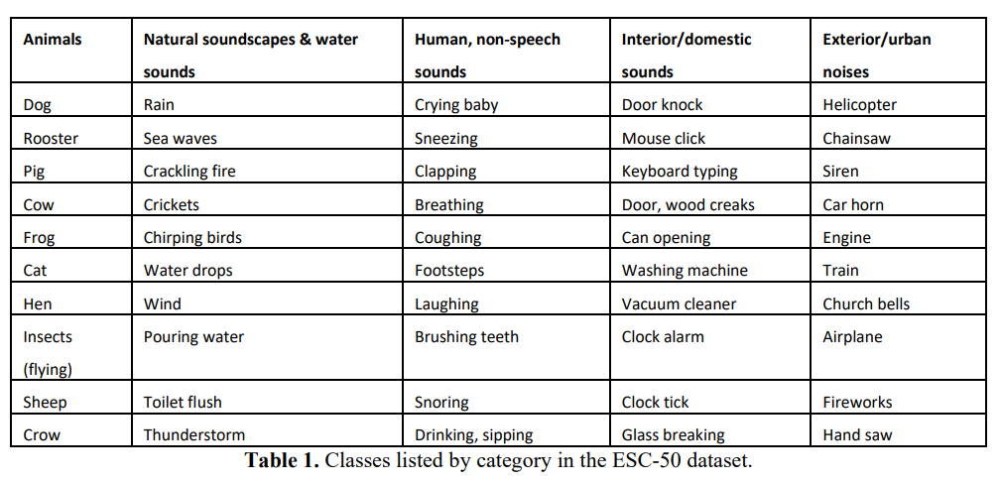

In [ ]:
class Download_data():
  def __init__(self):
    self.train_DIR= Path('/content/ESC-50-master/audio')

    if not self.train_DIR.exists():
      drive.mount('/content/gdrive/')
      !unzip -q /content/gdrive/MyDrive/data/main_data.zip

    self.class_info = pd.read_csv(Path('/content/ESC-50-master/meta/esc50.csv')).sort_values(by='filename')

  def get_data(self, random_state=42): # sr- частота дискритизации, sr*sound_time= len(sig)
    data = np.array(sorted(self.train_DIR.rglob('*.wav')))
    return data, np.array(self.class_info['target'])

В статье [An Ensemble of Convolutional Neural Networks for Audio
Classification](https://www.researchgate.net/publication/352684352_An_Ensemble_of_Convolutional_Neural_Networks_for_Audio_Classification) рассматривается влияние различных видов аугментаций на конечный результат. Вот несколько из них:

SpeedupFactorRange scales the speed of the signal by a random number in the range of [0.8, 1.2]

SemitoneShiftRange shifts the pitch of the signal by a random number in the range of [−2,2]
semitones

VolumeGainRange increases or decreases the gain of the signal by a random number in the range
of [−3,3] dB

SNR injects random noise into the signal in the range of [0, 10] dB;

TimeShiftRange shifts the time of the signal in the range of [−0.005, 0.005]s

В Data augmentation at the spectrogram level works poorly on ESC-50 as well as on two other datasets. SGN and data augmentation at the signal level work well across all the datasets. - вот что упомянается в статье. Классические аугментации приминяются на дискритизированную звуковую дорожку, что делает ее универсальной и сильно облегчает ее применение. Имеено из-за ее универсальности, хорошей интерпретируемости я буду использвовать SGN.

В работе, я буду использовать следующий классические виды аугментаций: TimeShifting, NormalNose, PitchShifting, VolumeGainRange, TimeStretch

#### Код для аугментаций и кастомного датасета

In [ ]:
class TimeStretch(nn.Module): # изменяет длительность
  def __init__(self, stretch_level=[0.9, 1.1]):
    super().__init__()
    self.stretch_level = stretch_level

  def forward(self, data):
    rate = np.random.uniform(*self.stretch_level)
    augmented_data = librosa.effects.time_stretch(data, rate)

    if len(augmented_data) > len(data):
      augmented_data = augmented_data[:len(data)]
    else:
      augmented_data = np.append(augmented_data, 
                                 np.zeros(len(data)- len(augmented_data)))
      
    return augmented_data


class ShiftingTime(nn.Module): # сдвиг по времени
  def __init__(self, shift_persent=0.2):
    super().__init__()
    self.shift_persent = shift_persent

  def forward(self, data):
    shift_max = np.random.randint(len(data) * self.shift_persent)
    direction = np.random.randint(low=-1, high=2)

    if shift_max > 0:
      shift = direction * np.random.randint(shift_max)
    else:
      shift = 0

    augmented_data = np.roll(data, shift)

    if shift >= 0:
      augmented_data[:shift] = 0
    else:
      augmented_data[shift:] = 0

    return augmented_data


class NormalNose(nn.Module): # Гаусс. шум
  def __init__(self, nose_level=[0, 0.05]):
    super().__init__()
    self.nose_level = nose_level

  def forward(self, data):
    #(mean + 3*sigma*max(nose_level)) / 1. - %
    augmented_data = data + np.random.uniform(*self.nose_level) \
                     * np.random.randn(len(data))
    return augmented_data


class IncreaseSound(nn.Module): # случайным образом изменяем высоту, аплитуду сигнала
  def __init__(self, sound_up=[0.8, 1.2]):
    super().__init__()
    self.sound_up = sound_up

  def forward(self, data):
    augmented_data = data*np.random.uniform(*self.sound_up)
    return augmented_data

class PitchShift(nn.Module): # Сдвигает частоты
  def __init__(self, sr, pitch_level=[-2, 2]):
    super().__init__()
    self.pitch_level = pitch_level
    self.sr = sr

  def forward(self, data):
    try:
      n_steps = np.random.randint(*self.pitch_level)
      augmented_sound = librosa.effects.pitch_shift(
        data, sr=self.sr, 
        n_steps=n_steps)
    except:
      augmented_sound = data

    return augmented_sound

class Normalize(nn.Module):
  def __init__(self, eps = 0.001):
    super().__init__()
    self.eps = eps

  def forward(self, data):
    augmented_data = data / (max(abs(data)) + self.eps)
    return augmented_data


In [ ]:
class ESC50(Dataset):
  def __init__(self, data, target, transform_type='MS', aug_chance=0.5, 
               sr=44100, n_fft=4410, hop_length=308, n_mels=128, n_mfcc=32,
              shifttime_persent=0.2, pitch_level=[-1, 1], normalnose_level=[0,0.05], 
              stretch_level=[0.9, 1.1], sound_up=[0.8, 1.2]):

    self.data, self.target = data, target
    self.aug_chance = aug_chance
    self.transform_type = transform_type
    self.sr = sr

    self.Normalize= Normalize()
    self.sig_augmentation= nn.Sequential(
        PitchShift(sr=sr, pitch_level=pitch_level),
        ShiftingTime(shift_persent=shifttime_persent),
        TimeStretch(stretch_level=stretch_level),
        Normalize(),
        IncreaseSound(sound_up=sound_up),
        NormalNose(nose_level=normalnose_level)
    )

    #2206, 716
    self.resize= torchvision.transforms.Resize((2206//6, 716//6))

    self.transform= {
                     'S': nn.Sequential(tt.Spectrogram(n_fft= n_fft, hop_length= hop_length)), #,torchvision.transforms.Resize(size=[128, 5*sr/hop_length])
                     'MS': tt.MelSpectrogram(sample_rate=sr, n_fft=n_fft, 
                                             hop_length=hop_length, n_mels=n_mels),
                     'MFCC': tt.MFCC(sample_rate=sr, n_mfcc=n_mfcc, 
                                     melkwargs={"n_fft": n_fft, "hop_length": hop_length, "n_mels": n_mels, "center": False})
                    }

  def PlotData(self, count=4):
      with torch.no_grad():
        for idx in range(count):
          plot_idx= np.random.randint(low=0, high=len(self.data))
          item, _= torchaudio.load(self.data[plot_idx])
          item= np.array(item)[0]
          aug_item= self.sig_augmentation(item)
          print('Максимальная амплитуда ДО ауг {0}.'.format(np.max(item)))
          print('Максимальная амплитуда ПОСЛЕ ауг {0}.'.format(np.max(aug_item)))
          fig, ax= plt.subplots(nrows= 2, ncols= 2, figsize=(14, 12))
          ax[0,1].set_title('После аугментации')
          ax[0,0].set_title('До аугментации')
          ax[0,0].plot(item)
          ax[0,1].plot(aug_item)
          ax[1,0].imshow(self.transform[self.transform_type](torch.Tensor(item)))
          ax[1,1].imshow(self.transform[self.transform_type](torch.Tensor(aug_item)))
          plt.show()

          display(ipd.Audio(item, rate=self.sr))
          display(ipd.Audio(aug_item, rate=self.sr))


  def __len__(self):
    return len(self.data)

  def __getitem__(self, index):
    with torch.no_grad():
      target=  self.target[index]
      item, _= torchaudio.load(self.data[index])
      item= np.array(item)[0] #  shape= [1, 220500]

      # display(ipd.Audio(item, rate=self.sr))
      # print(target)

      if np.random.uniform(low= 0, high=1) < self.aug_chance:
        item= self.sig_augmentation(item)  # если не переведем в np.array агументация работать не будет, тензоры не дружат с леброса
      else:
        item= self.Normalize(item)

      item= self.transform[self.transform_type](torch.Tensor(item))

      if self.transform_type== "S":
        return self.resize(item[None,:,:]), target

      return item[None, :, :], target




### Визуализация данных

Давайте взглянем на наш датасет. Начальные гиперпараметры n_fft, hop_length для Mel спектрограммы я буду использовать из [Fine-Tuning ResNet-18 for Audio Classification](https://wandb.ai/jhartquist/fastaudio-esc-50/reports/Fine-Tuning-ResNet-18-for-Audio-Classification--VmlldzoyOTAyMzc), где валидировались гиперпараметры для ESC50 при работе с ResNet18. Конечно, наилучшим образом будет аккуратный подбор данных гиперпараметров, но использование GridSearch или RandomSearch невероятно долгая процедура.

In [ ]:
random_state= 42

data_downloader= Download_data()
data, target= data_downloader.get_data()

some_info= data_downloader.class_info['category'].value_counts()
print('Количество классов= {}'.format(len(some_info)))
print(' '.join(data_downloader.class_info['category'].unique()))
some_info.head()

Mounted at /content/gdrive/
Количество классов= 50
dog chirping_birds vacuum_cleaner thunderstorm door_wood_knock can_opening crow clapping fireworks chainsaw airplane mouse_click pouring_water train sheep water_drops church_bells clock_alarm keyboard_typing wind footsteps frog cow brushing_teeth car_horn crackling_fire helicopter drinking_sipping rain insects laughing hen engine breathing crying_baby hand_saw coughing glass_breaking snoring toilet_flush pig washing_machine clock_tick sneezing rooster sea_waves siren cat door_wood_creaks crickets


dog                 40
glass_breaking      40
drinking_sipping    40
rain                40
insects             40
Name: category, dtype: int64

Мы имеем 50 уникальных классов. Аудиодорожки, как мы увидим дальше, имееют разные наборы частот. При этом классы сбалансированы, каждый из них имеет 40 объектов, что довольно мало для такой задачи.

Посмотрим, что из себя представляют дескритизированные данные.

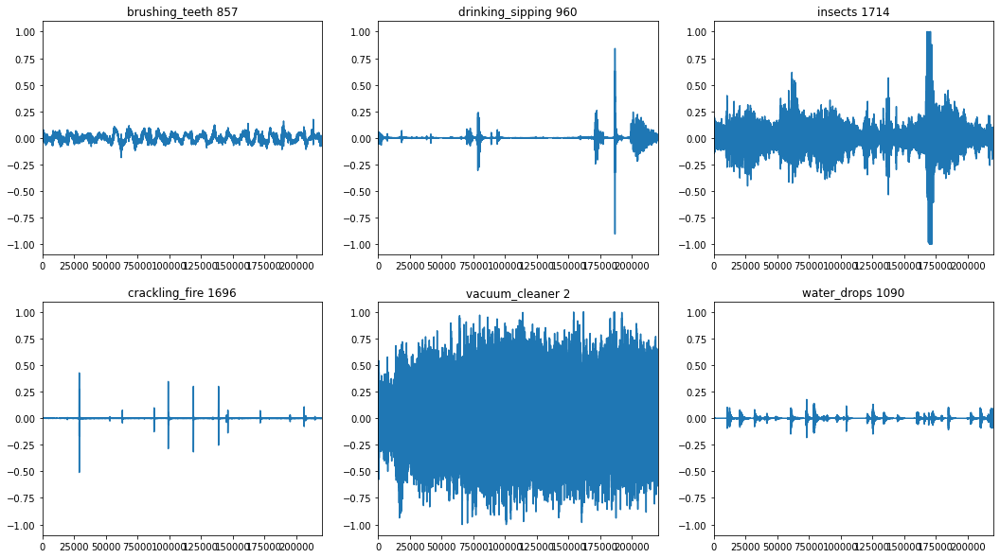

In [ ]:
nrows, ncols= 2, 3
fig, ax= plt.subplots(nrows=nrows, ncols=ncols, figsize=(18,10))
sound= []
with torch.no_grad():
  for i in range(nrows):
    for j in range(ncols):
      idx = np.random.randint(low=0, high=len(data))
      item, _ = torchaudio.load(data[idx])
      item= np.array(item)
      sound.append(idx)
      ax[i,j].plot(item[0])
      ax[i,j].set_title(data_downloader.class_info['category'][idx] + ' {}'.format(idx))
      ax[i,j].set(ylim=[-1.1,1.1], xlim=[0, 44100*5])
      display(ipd.Audio(item, rate=44100))

  plt.show()

#or item in sound: display(ipd.Audio(item, rate= 44100))

Посмотрим влияние аугментации на наши данные.

Заметим, что гауссов шум почти не влияет на вид mel спектрограмм, т.к. амплитуды основных частот вносят больший вклад в спектрограмму, но при прослушивание дорожки, он создает слышимое присутствие. Это связано с тем, что нормальный шум раскладывается на множество частот с малыми амплитудама (белый шум имеет одинаковую интенсивность во времени), поэтому на спектрограмме он почти не заметен. Также, в данных пресутствует множество довольно слабых звуков (например звук чистки зубов), уровень нормального шума подбирался так, чтобы было возможно задетектировать ухом редкие тихие звуки.




Использование TimeStrech аугментации сильно меняет амплитуду, что затрудняет работу с нормировкой нормального шума. По-этому использование нормировки после TimeStrech является разумным решением.

#### Пример сильного влияния белого шума

Пример влияения сильного Гауссового шума на данные. На мел спектрограмме, еще прослеживаются паттерны, соответствующие изначальному звуку, однако изначальный звук на аудиодорожке услышать довольно сложно. Как уже было сказано выше, белый шум имеет постоянную во времени интенсивность, его прибавление добавляет постоянные величины к спектрограмме. Грубо говоря, белый шум раскладывается на большое число малоамплитудных частот, по-этому на спектрограмме на фоне основных частот они не видны.

Максимальная амплитуда ДО ауг 0.901947021484375.
Максимальная амплитуда ПОСЛЕ ауг 1.6998062454818497.


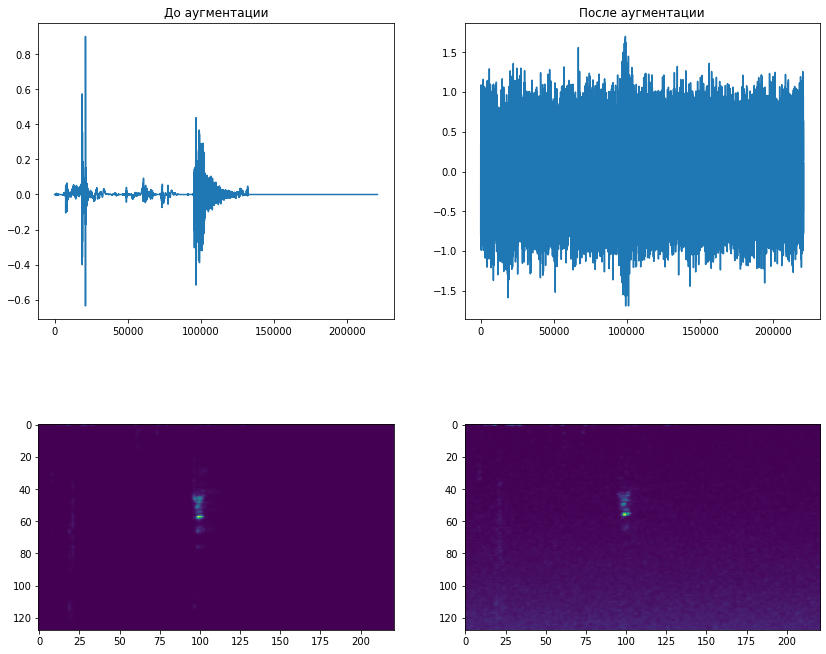

In [ ]:
DATA= ESC50(data= data, target=target, transform_type='MS', 
            sr=44100, n_fft=4410, hop_length=1000, n_mels=128,
            aug_chance=1, shifttime_persent=0.2, pitch_level=[-1,1], 
            normalnose_level=[0.3, 0.4], stretch_level=[0.9, 1.1], sound_up=[0.8, 1.2])
DATA.PlotData(count=1)

#### Пример MFCC

Заметим, что даже при слабой аугментации, дабавлении шума, измении частот объекты меняются довольно сильно.

Максимальная амплитуда ДО ауг 0.222137451171875.
Максимальная амплитуда ПОСЛЕ ауг 0.8809717574255767.


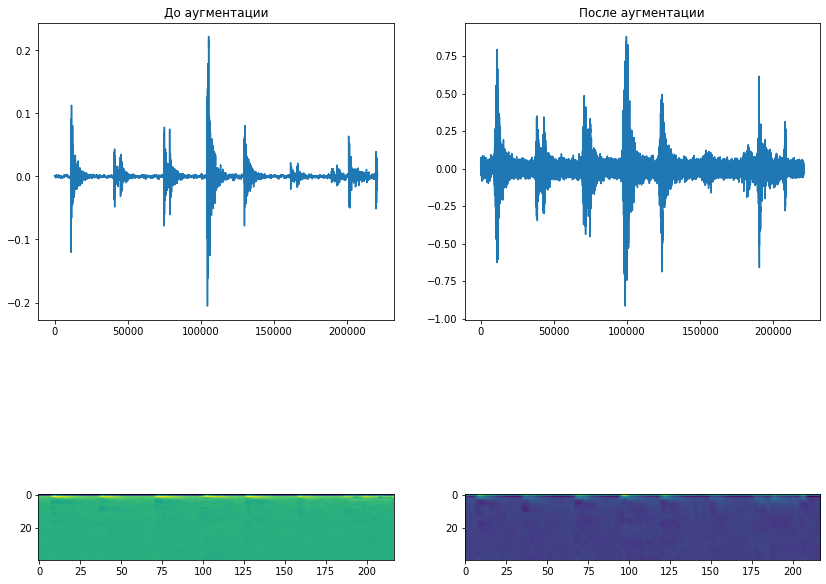

Максимальная амплитуда ДО ауг 0.57940673828125.
Максимальная амплитуда ПОСЛЕ ауг 1.0731101358859694.


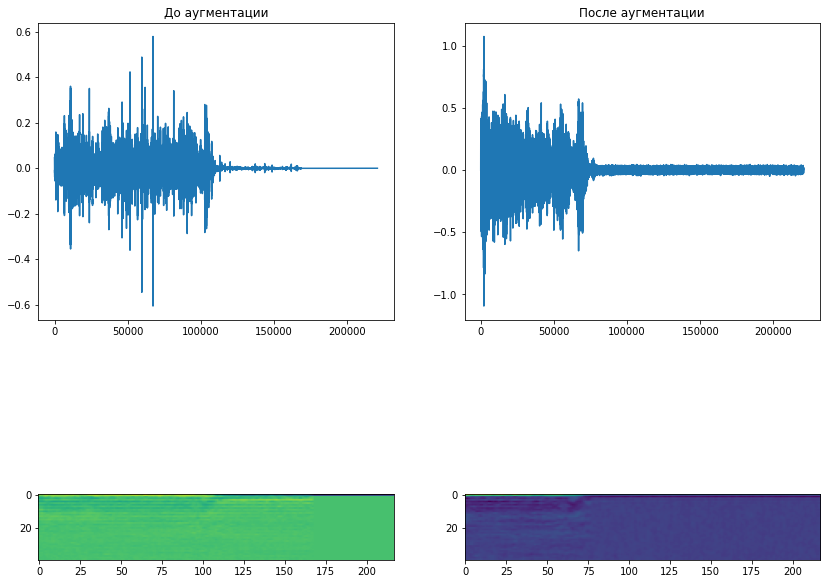

Максимальная амплитуда ДО ауг 0.6702880859375.
Максимальная амплитуда ПОСЛЕ ауг 0.8974688544571084.


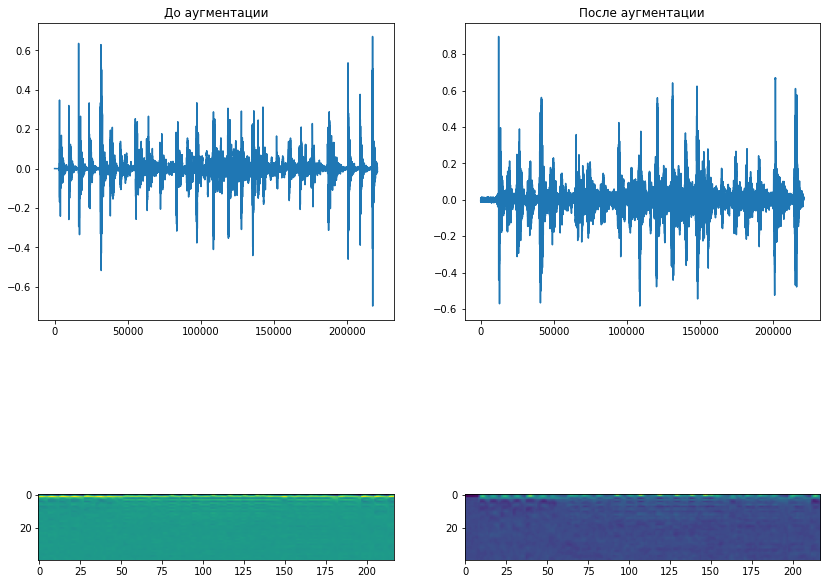

In [ ]:
DATA= ESC50(data=data, target=target, transform_type='MFCC', 
            sr=44100, n_fft=4410, hop_length=1000, n_mels=128, n_mfcc=40,
            aug_chance= 1, shifttime_persent=0.2, pitch_level=[-1,1], 
            normalnose_level=[0,0.02], stretch_level=[0.9, 1.1], sound_up=[0.8, 1.2])

DATA.PlotData(count=3)

#### Пример MS

Максимальная амплитуда ДО ауг 0.43463134765625.
Максимальная амплитуда ПОСЛЕ ауг 0.8774570721233423.


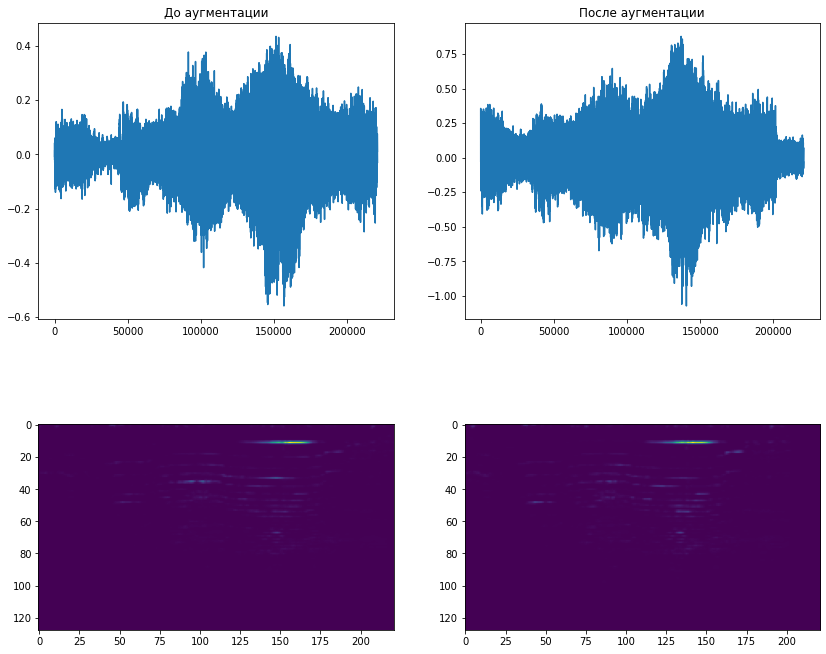

Максимальная амплитуда ДО ауг 0.790283203125.
Максимальная амплитуда ПОСЛЕ ауг 1.1281760111303447.


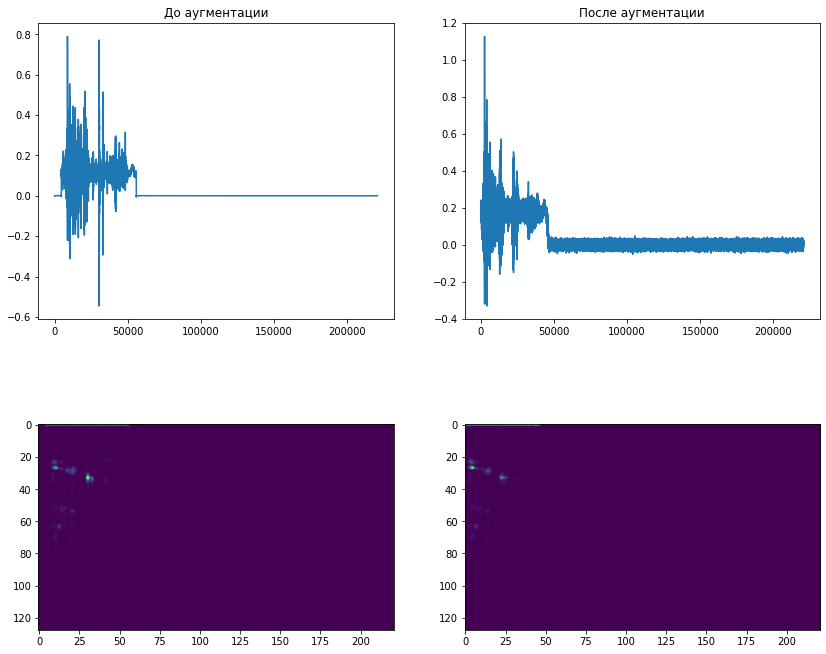

Максимальная амплитуда ДО ауг 0.976409912109375.
Максимальная амплитуда ПОСЛЕ ауг 0.9135182196815823.


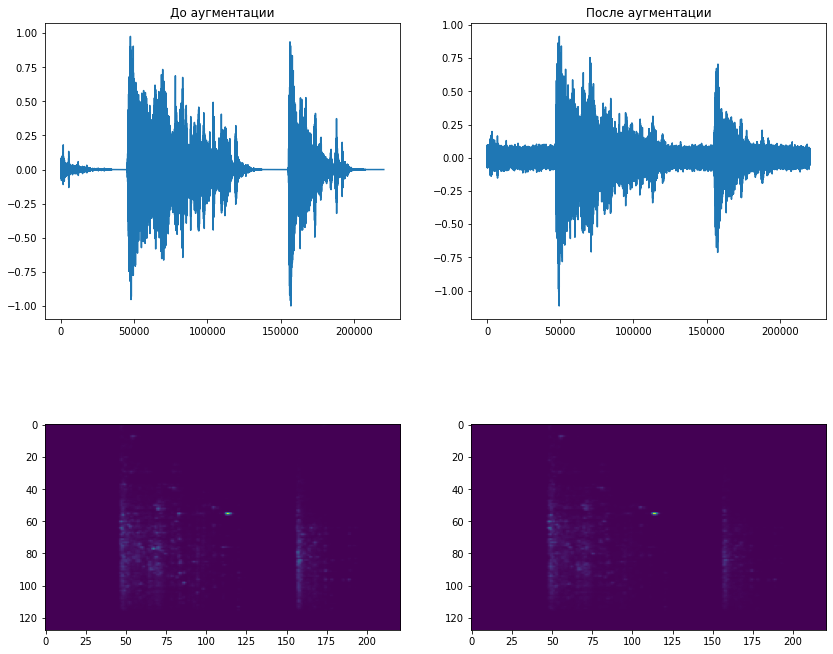

In [ ]:
DATA= ESC50(data=data, target=target, transform_type='MS', 
            sr=44100, n_fft=4410, hop_length=1000, n_mels=128,
            aug_chance=1, shifttime_persent=0.2, pitch_level=[-1, 1], 
            normalnose_level=[0,0.05], stretch_level=[0.9, 1.1], sound_up=[0.8, 1.2])
DATA.PlotData(count=3)

#### Пример S

Аугментация была специально убрана, чтобы было наглядно видно отличие данных спектрограмм

Максимальная амплитуда ДО ауг 0.85406494140625.
Максимальная амплитуда ПОСЛЕ ауг 0.9759389361466876.


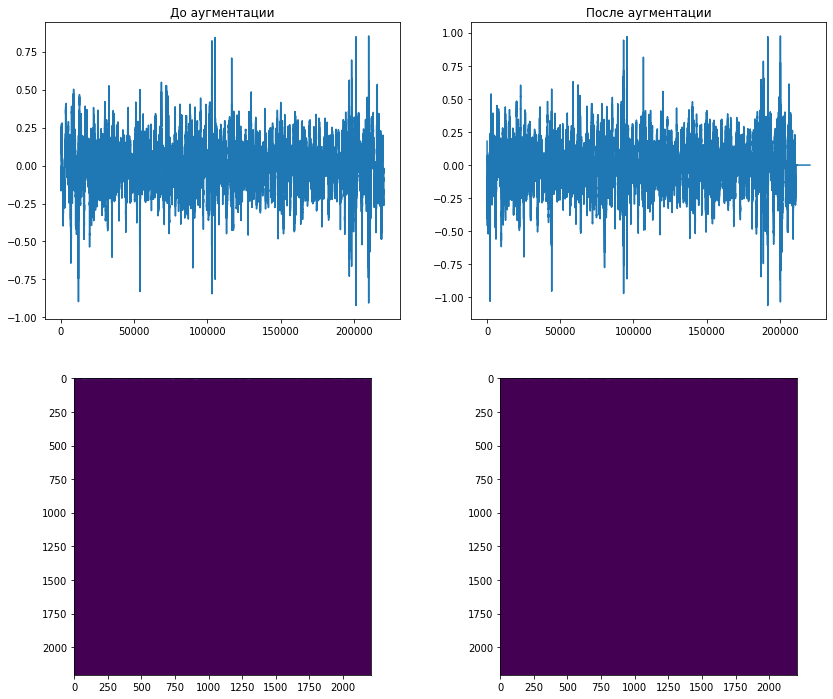

Максимальная амплитуда ДО ауг 0.65777587890625.
Максимальная амплитуда ПОСЛЕ ауг 1.1123409851490498.


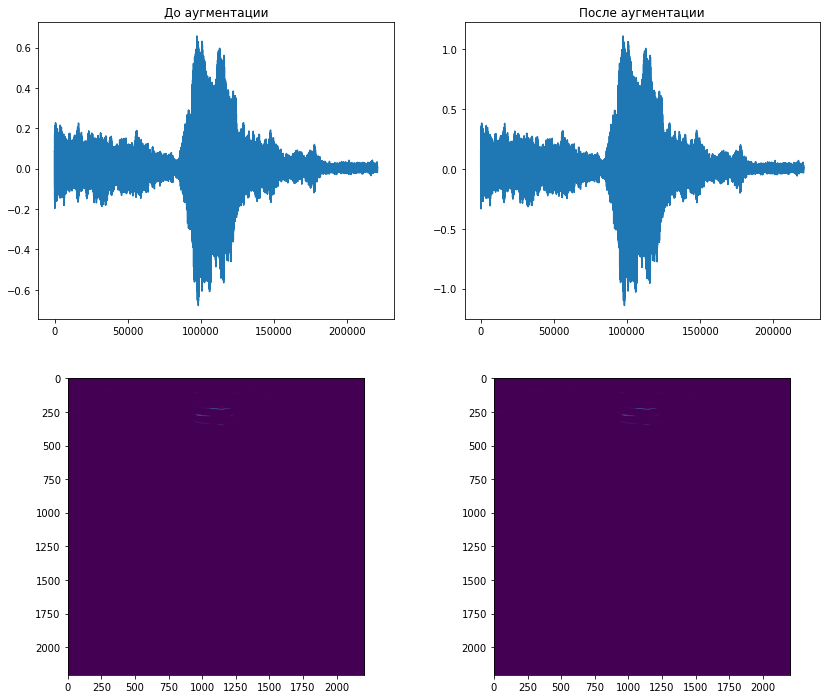

Максимальная амплитуда ДО ауг 0.999969482421875.
Максимальная амплитуда ПОСЛЕ ауг 0.930940681795253.


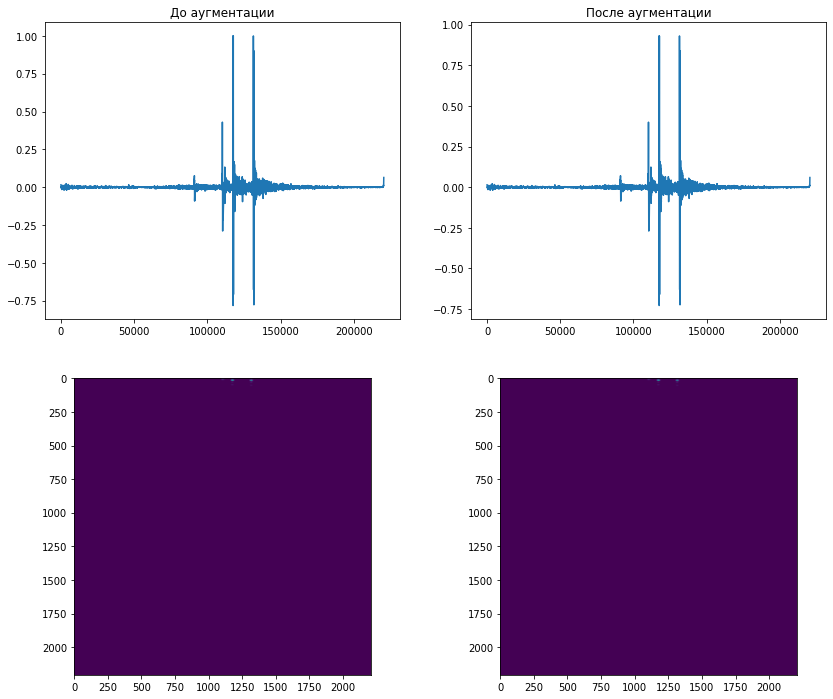

In [ ]:
DATA= ESC50(data=data, target=target, transform_type='S', 
            sr=44100, n_fft=4410, hop_length=100, n_mels=128, n_mfcc=64,
            aug_chance=1, shifttime_persent=0.2, pitch_level=[0,0], 
            normalnose_level=[0,0], stretch_level=[1, 1], sound_up=[0.8, 1.2])
DATA.PlotData(count= 3)

### Модель

Модель для классификации состоит из двух подсетей. Первая из которых- сверточная нейросеть, которая извлекает фичи из спектрограммы. Вторая- полносвязный класификатор, выдающий вероятности пренадлежности к каждому из классов. Так как, на спектрограмма нет сильно сложных паттернов можно использовать не очень глобокие нейросети. Например в [An Ensemble of Convolutional Neural Networks for Audio
Classification](https://www.researchgate.net/publication/352684352_An_Ensemble_of_Convolutional_Neural_Networks_for_Audio_Classification)
 использовали ансамбль из легковесных сетей, при этом, как утверждает автор, наилучший результат из одиночных сетей показала VGG16 со среднем значение accuracy на 5 фолдах равным 80%.

Существуеют более сильные модели, которые описаны в статьях

[A Sequential Self Teaching Approach for
Improving Generalization in Sound Event Recognition](https://arxiv.org/pdf/2007.00144.pdf)

[Efficient End-to-End Audio Embeddings Generation for Audio Classification on Target Applications](https://www.researchgate.net/publication/352171397_Efficient_End-to-End_Audio_Embeddings_Generation_for_Audio_Classification_on_Target_Applications)
 и тд., но большая часть из них имело дополнительные данные для обучения, обычно в качестве данных для предобучения выступал датасет Audioset. Можно было бы использовать трансфер лернинг. Но мне показалось менее творческих и исследовательским подходом, по-этому я реализую модель из статей ( которые не используют предообучение на AudioSet)

При написании модели, я руководствовался следующими идями. Модель должна работать для различных входных данных, так как я исследую различные виды спектрограмм MS, MFCC, S. Модель не должна иметь дополнительных данных для обучения, например AudioSet. В статье [Fine-Tuning ResNet-18 for Audio Classificationсь](https://wandb.ai/jhartquist/fastaudio-esc-50/reports/Fine-Tuning-ResNet-18-for-Audio-Classification--VmlldzoyOTAyMzc) уже была рассмотрена проблема гиперпараметров для сети ResNet18 для случая MS.




***Случай MS***

Наилучшие значения для ESC50 mel spectrogram, как утверждает автор:
sr= 44100, hop_length= 308, n_fft= 2205 или 4410.


***Случай MFCC***

Так как, MFCC чаще используется при распозновании голосов, по-этому, некоторых опорных значений для кросс валидации для датасета ESC50 будут использованы аналогичные со случаем MS. Для n_mfcc возьмем стандартное значение значение равное 40.


***Случай S***

Обычные спектрограммы в отличие от MS, MFCC не имеют логарифмической шкалы. Следовательно область значений частот по оси Y принимает больший диапазон значений. S фичмапы имеют больший размер, требуют больше памяти для работы с ними=> батчи при работе с ними должны быть меньше, при этом, если использовать аналогичные параметры AdaptiveAvgPool2d() при работе с S-представлением, то будет теряться много информации => значения конечных фичмап перед классификатором можно будет увеличить при ниобходимости.

#### VGG16

Использование Макспулов со страйдом 2 помогает бороться с проблемой пространственной локализации и маштабирования, при этом сильно снизить число параметров модели. По-этому, размер ядра по горизонтали можно не увиличивать ( увеличение размера ядра сильно приведет к увеличению параметров модели, можно , конечно, использовать pointwise и depthwise свертки, но мы ограничемся VGG16, так как эксперименты из предыдщущих статей указывают на то, что она работает довольно хорошо с данным датасетом). Модель довольно сильная, чтобы снизить шанс переобучения и выучивать более стабильные закономерности, было добавлено 2 DropOut после первого и второго ленейных слоев при p=0.4.

In [ ]:
class ConvBlock3(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
            # nn.BatchNorm2d(num_features=out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
            # nn.BatchNorm2d(num_features=out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
            # nn.BatchNorm2d(num_features=out_channels),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, dilation=1, stride=2)
        )

    def forward(self, x):
        return self.block(x)


In [ ]:
class ClassifyBlock(nn.Module):
    def __init__(self, in_features):
        super().__init__()

        self.block = nn.Sequential(
            nn.Linear(in_features=in_features, out_features=4096),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),

            nn.Linear(in_features=4096, out_features=4096),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),

            nn.Linear(in_features=4096, out_features=50),
            nn.Softmax(dim=-1),
        )

    def forward(self, x):
        return self.block(x)


In [ ]:
class Model(nn.Module):
    def __init__(self, adappol_params=(2, 17)):
        super().__init__()

        self.in_block = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=64, kernel_size=3, stride=1, padding=1),
            # nn.BatchNorm2d(num_features=64),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            # nn.BatchNorm2d(num_features=64),
            nn.ReLU(inplace=True),

            nn.MaxPool2d(kernel_size=2, dilation=1, stride=2),

            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1),
            # nn.BatchNorm2d(num_features=128),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1),
            # nn.BatchNorm2d(num_features=128),
            nn.ReLU(inplace=True),

            nn.MaxPool2d(kernel_size=2, dilation=1, stride=2)
        )

        self.conv_block = nn.Sequential(
            ConvBlock3(in_channels=128, out_channels=256),
            ConvBlock3(in_channels=256, out_channels=512),
            ConvBlock3(in_channels=512, out_channels=512)
        )

        self.flatt_block = nn.Sequential(
            nn.AdaptiveAvgPool2d(adappol_params),
            nn.Flatten()
        )

        in_features = 128 * 2 ** 2 * adappol_params[0] * adappol_params[1]
        self.classify_block = ClassifyBlock(in_features=in_features)

    def forward(self, x):
        x = self.in_block(x)
        x = self.conv_block(x)
        x = self.flatt_block(x)
        x = self.classify_block(x)
        return x


 #### Deep CNN for Weakly Labeled Audio

Изначально, при обучении VGG16 я столкнулся с ее плохой сходимостью. В момент, когда модель обучалась, чтобы лишний раз проверить сходится ли она, я решил написать еще одну более легкую модель, которая в частности, быстрее бы предообучилась на AudioSet в случае необходимости (Если бы я не смог побороть плохой результат сходимости VGG)

Из статьи

KNOWLEDGE TRANSFER FROM WEAKLY LABELED AUDIO USING CONVOLUTIONAL
NEURAL NETWORK FOR SOUND EVENTS AND SCENES

Anurag Kumar

Deep CNN for Weakly Labeled Audio

B1 : 16, B2 : 32, B3 : 64, B4 : 128, B5 : 256, B6 : 512

In [ ]:
class B1Block(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.block = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=out_channels),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=out_channels),
            nn.ReLU(inplace=True),

            nn.MaxPool2d(kernel_size=2, stride=2)
        )

    def forward(self, x):
        return self.block(x)


class B6Block(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.block = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=out_channels),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

    def forward(self, x):
        return self.block(x)


class F1Block(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.block = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.block(x)



In [ ]:
class ACLNETModel(nn.Module):
    def __init__(self):
        super().__init__()
        conv_blocks = [B1Block(in_channels=1, out_channels=16)]
        for i in range(4):
            conv_blocks += [B1Block(in_channels=16 * 2 ** i, out_channels=16 * 2 ** (i + 1))]
        self.B1_B5 = nn.Sequential(*conv_blocks)
        # self.B6= B6_block(in_channels= 256,  out_channels= 512)  # после этого блока размерность фичмапы будет снижена в 64 раза, мы хотем использовать нейросеть для различных n_mels
        self.F1 = F1Block(256, 512)

        self.classify = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 10)),
            nn.Flatten(),

            nn.Linear(in_features=512 * 10, out_features=512),
            nn.Dropout(p=0.2),
            nn.ReLU(),

            nn.Linear(in_features=512, out_features=50),
            nn.Softmax(dim=1)
        )

    def forward(self, x):
        x = self.B1_B5(x)
        x = self.F1(x)
        x = self.classify(x)
        return x




### Обучение

#### Функция для обучения

Почему будет использовать именно этот лосс, а не nn.CrossEntropyLoss из коробки, будет рассказано далее.

In [ ]:
class LogLoss(nn.Module): # почему была написан данный лос будет объяснено далее
  def __init__(self):
    super().__init__()

  def forward(self, y_pred, y_true):
    loss = 0

    for idx in range(len(y_true)):
      loss -= torch.log(y_pred[idx, y_true[idx]] + 0.0001)
      
    return loss / len(y_true)


In [ ]:
def accuracy(y_pred, y_true):
  return torch.sum(y_pred==y_true) / len(y_pred)

In [ ]:
def history_plot(train_history_loss, train_history_accuracy, 
                 val_history_loss, val_history_accuracy, epoch):
  x= np.arange(0, epoch + 1, 1)

  fig, ax= plt.subplots(nrows=2, ncols=2,figsize=(16, 14))
  ax[0,0].plot(x, train_history_loss)
  ax[0,1].plot(x, val_history_loss)
  ax[1,0].plot(x, train_history_accuracy)
  ax[1,1].plot(x, val_history_accuracy)

  ax[0,0].set_title('train_loss')
  ax[0,1].set_title('val_loss')
  ax[1,0].set_title('train_accuracy')
  ax[1,1].set_title('val_accuracy')

  plt.show()

##### Трейн с кросс валидацией

Как уже было сказано выше, данных для обучения довольно мало. По-этому, методы регуляризации, в частности дропауты, аугментации играют одно из ключевых ролей. Также, чтобы не терять часть данных будет использована кроссваладиация.

transform_type= 'MS', aug_chance= 0.5, sr= 44100, n_fft= 4410, hop_length= 308, n_mels= 128, n_mfcc= 32,
              shifttime_persent=0.2, pitch_level=[-1, 1], normalnose_level= [0,0.05], stretch_level=[0.9, 1.1], sound_up= [0.8, 1.2] `

In [ ]:
# def train_cross(model, optimizer, criterion, max_epoch, metric, X_train_val, y_train_val, scheduler, device,
#                 k_folds= 5, batch_size= 32, random_state= 42,
#                 transform_type= 'MS', n_fft= 4410, hop_length= 308, n_mels= 128, n_mfcc= 40,
#                 aug_chance= 0.6, pitch_level=[-3, 3], normalnose_level= [0,0.05], stretch_level=[0.8, 1.2], sound_up= [0.8, 1.2]
#                 ):
#   train_history_loss, val_history_loss= [], []
#   train_history_metric, val_history_metric= [], []
#   rs = ShuffleSplit(n_splits=k_folds, test_size=1/k_folds, random_state= random_state)

#   for epoch in range(max_epoch):
#     print(epoch+1)
#     train_batch_counter, val_batch_counter= 0, 0
#     train_loss, val_loss= 0, 0
#     y_train_batch_predict, y_train_batch_true= [], []
#     y_val_batch_predict, y_val_batch_true= [], []


#     for train_indexes, val_indexes in rs.split(X_train_val):

#       train_data= ESC50(X_train_val[train_indexes], y_train_val[train_indexes], transform_type=transform_type,
#                         n_fft= n_fft, hop_length= hop_length, n_mels= n_mels,
#                         aug_chance= aug_chance, pitch_level=pitch_level, normalnose_level= normalnose_level, stretch_level= stretch_level, sound_up=sound_up)
#       val_data= ESC50(X_train_val[val_indexes], y_train_val[val_indexes], transform_type=transform_type, aug_chance= 0, n_fft= n_fft, hop_length= hop_length, n_mels= n_mels)
#       # не забываем убрать аугментацию у VAL
#       train_data_loader= DataLoader(train_data, batch_size= batch_size, shuffle= True, drop_last= True)
#       val_data_loader= DataLoader(val_data, batch_size= batch_size, shuffle= True, drop_last= True)

#       model.train()
#       for x_batch, y_batch in tqdm(train_data_loader):
#         x_batch= x_batch.to(device)
#         y_batch= y_batch.to(device)

#         optimizer.zero_grad()
#         y_pred= model(x_batch)
#         loss= criterion(y_pred, y_batch)
#         print(loss.to('cpu'))
#         loss.backward()
#         optimizer.step()

#         y_train_batch_predict+= torch.argmax(y_pred.to('cpu'), dim= 1) # дальше хотим посчитать метрику
#         y_train_batch_true+= y_batch.to('cpu')
#         train_loss+= loss.to('cpu')                                    # чтобы усредить лосс по всем батчам
#         train_batch_counter+= 1



#       model.eval()
#       with torch.no_grad():
#         for x_val_batch, y_val_batch in val_data_loader:
#           x_val_batch= x_val_batch.to(device)
#           y_val_batch= y_val_batch.to(device)

#           y_val_pred= model(x_val_batch)

#           y_val_batch_predict+= torch.argmax(y_val_pred.to('cpu'), dim= 1)
#           y_val_batch_true+= y_val_batch.to('cpu')

#           val_loss+= criterion(y_val_pred, y_val_batch).to('cpu')
#           val_batch_counter+= 1
#     clear_output()
#     ##### конец кросс валидации ####
#     scheduler.step()                             # scheduler
#     with torch.no_grad():
#       train_history_metric.append(metric(torch.stack(y_train_batch_predict), torch.stack(y_train_batch_true), num_classes= 50))
#       val_history_metric.append(metric(torch.stack(y_val_batch_predict), torch.stack(y_val_batch_true), num_classes= 50))
#       train_history_loss.append(train_loss/train_batch_counter) # усредняем лосс по всей кросс валидации
#       val_history_loss.append(val_loss/val_batch_counter)

#       if epoch+1== max_epoch: torch.save(model.state_dict(), '/content/gdrive/MyDrive/data/model/generator_16_vesov_vgg{0}_{1}.pt'.format(epoch,time()//10%100))

#       history_plot(train_history_loss, train_history_metric, val_history_loss, val_history_metric, epoch)

#   return  train_history_metric, val_history_metric, train_history_loss, val_history_loss

##### Трейн без кросс валидации

In [ ]:
def train(model, optimizer, criterion, max_epoch, metric, train_data_loader, val_data_loader, scheduler, device, k_folds= 5, batch_size= 64, random_state= 42,
          n_fft= 4410, hop_length= 308, n_mels= 128, ):
  train_history_loss, val_history_loss= [], []
  train_history_metric, val_history_metric= [], []

  for epoch in tqdm(range(max_epoch)):
    print(epoch)
    train_batch_counter, val_batch_counter= 0, 0
    train_loss, val_loss= 0, 0
    y_train_batch_predict, y_train_batch_true= [], []
    y_val_batch_predict, y_val_batch_true= [], []

    model.train()
    for x_batch, y_batch in tqdm(train_data_loader):
      x_batch= x_batch.to(device)
      y_batch= y_batch.to(device)

      optimizer.zero_grad()
      y_pred= model(x_batch)
      loss= criterion(y_pred, y_batch)
      loss.backward()
      optimizer.step()

      y_train_batch_predict+= torch.argmax(y_pred.to('cpu'), dim= 1) # дальше хотим посчитать метрику
      #y_train_batch_predict+= y_pred.to('cpu')
      y_train_batch_true+= y_batch.to('cpu')
      train_loss+= loss.to('cpu')              # чтобы усредить лосс по всем батчам
      train_batch_counter+= 1

    model.eval()
    with torch.no_grad():
      for x_val_batch, y_val_batch in val_data_loader:
        x_val_batch= x_val_batch.to(device)
        y_val_batch= y_val_batch.to(device)

        y_val_pred= model(x_val_batch)

        y_val_batch_predict+= torch.argmax(y_val_pred.to('cpu'), dim= 1)
        #y_val_batch_predict+= y_val_pred.to('cpu')
        y_val_batch_true+= y_val_batch.to('cpu')

        val_loss+= criterion(y_val_pred, y_val_batch).to('cpu')
        val_batch_counter+= 1

    clear_output()
    scheduler.step()          # scheduler

    ##################### Посчитаем средние метрики и лоссы
    with torch.no_grad():
      train_history_metric.append(metric(torch.stack(y_train_batch_predict), torch.stack(y_train_batch_true)))
      val_history_metric.append(metric(torch.stack(y_val_batch_predict), torch.stack(y_val_batch_true)))
      train_history_loss.append(train_loss/train_batch_counter) # усредняем лосс по всей кросс валидации
      val_history_loss.append(val_loss/val_batch_counter)

      if (epoch+1) % 5==0: torch.save(model.state_dict(), '/content/generator_16_vesov_vgg{0}_{1}.pt'.format(epoch,time()//10%100))

      history_plot(train_history_loss, train_history_metric, val_history_loss, val_history_metric, epoch)

  return  train_history_metric, val_history_metric, train_history_loss, val_history_loss

#### Анализ некоторых гиперпараметров

Отложим 20 % датасета на тест. Остальную часть будем использовать в виде трейна и вал части. Из-за долгого обучения при подборе гиперпараметров я не буду использовать кросс валидацию (в конечном итоге, когда будет произведена оценка гиперпараметров, будет использована кросс валидация). По-этому, отложим еще 20 процентов под вал часть и оставшиеся 60% возьмем в качестве трейна.

В качестве метрики берем Accuracy, долю верно предсказанных классов. Наши классы сбалансированы между собой и имеют одинаковый вес. По-этому, складываем все предсказания за 1 проход по датасету и считаем Accuracy, как sum(y_pred==y_true)/len(y_pred).

Accuracy также чаще используется в статьях, которые исследуют классификацию ESC50. Ее выбор позволит сравнить свои результаты с похожими работами.

Изначально для обучения я использовал nn.CrosEntropyLoss. Но при его использовании модель не сходилась.

Я нашел информацию о данной проблеме в статье [KNOWLEDGE TRANSFER FROM WEAKLY LABELED AUDIO USING CONVOLUTIONAL
NEURAL NETWORK FOR SOUND EVENTS AND SCENES](https://arxiv.org/pdf/1711.01369.pdf)

Там было написано следующие:

"VGG16 can fail to converge; when this happens, VGG16 undergoes a second training. VGG16
can also produce a numeric problem by assigning the same scores to all patterns (random
performance in the training set). In this case, all scores are considered zeros."

По-этому, было принято решение заменить nn.CrossEntropyLoss на class LogLoss(nn.Module).

Далее, я обучил модель без кроссвалидации при одном "наилучшем" значении гиперпараметров в MS представлении, чтобы удостоверится, что она будет лучше сходится, чем с nn.CrosEntropyLoss. Для этого я использовал следующий код.

In [ ]:
device= 'cuda' if torch.cuda.is_available else 'cpu'
device

'cuda'

In [ ]:
lr= 1E-4
max_epoch= 20
model= Model(adappol_params= (3, 30)).to(device)
#criterion= nn.CrossEntropyLoss()
criterion= LogLoss()
#metric= multiclass_recall
metric= accuracy
optimizer= torch.optim.Adam(model.parameters(), lr= lr)
scheduler= MultiStepLR(optimizer, [25], gamma= 0.1)

In [ ]:
random_state= 42

data_downloader= Download_data()
data, targets= data_downloader.get_data()

X_train_val, X_test, y_train_val, y_test= train_test_split(data, targets, test_size= 0.2, shuffle= True, random_state= random_state)
X_train, X_val, y_train, y_val= train_test_split(X_train_val, y_train_val, test_size= 0.25, shuffle= True, random_state= random_state)

print(len(X_train), len(X_val), len(X_test))

In [ ]:
train_data_loader= DataLoader(ESC50(X_train, y_train, aug_chance= 1, pitch_level= [-3, 3], normalnose_level= [0, 0.05],sound_up= [0.8, 1.2], stretch_level=[0.8, 1.2] ), batch_size= 32, shuffle= True)
val_data_loader=  DataLoader(ESC50(X_val, y_val, aug_chance= 0), batch_size= 32, shuffle= True)

train_metric, val_metric, train_loss, val_loss= train(model= model, optimizer= optimizer, criterion=criterion, max_epoch= max_epoch, metric= metric, train_data_loader= train_data_loader,
       val_data_loader= val_data_loader, scheduler= scheduler, device= device, k_folds= 5, batch_size= 32, random_state= 42)


##### Оценка влияния nn.BatchNorm2d

В классической VGG16 не используются бачнормы, и мне стало интересно, как их добавление повлияет на обучение. Далее будет проведен анализ влияние BatchNorm на ранний этап эволюции модели.


В [KNOWLEDGE TRANSFER FROM WEAKLY LABELED AUDIO USING CONVOLUTIONAL
NEURAL NETWORK FOR SOUND EVENTS AND SCENES](https://arxiv.org/pdf/1711.01369.pdf) статье использовались следующие параметры агументации


aug_chance= 0.5, pitch_level= [-3, 3], normalnose_level= [0, 0.10],sound_up= [0.8, 1.2]

 stretch_level=[0.8, 1.2], shifttime_persent=0.005

Я попробую оценить по динамику обучения при варьированнии параметров.

Используя следующий код, я получил результаты ниже.

При p=0.4 в Dropout, и

aug_chance= 0.4, pitch_level= [-3, 3], normalnose_level= [0, 0.01],sound_up= [0.8, 1.2]

batch_size= 32, stretch_level=[0.9, 1.1], sr= 44100, n_fft= 4410, hop_length= 308, n_mels= 128, n_mfcc= 32, shifttime_persent=0.2


при обучении с постоянным lr= 0.0001 при 20 эпохах, удалось достич следующего резульата (без батчнормы):

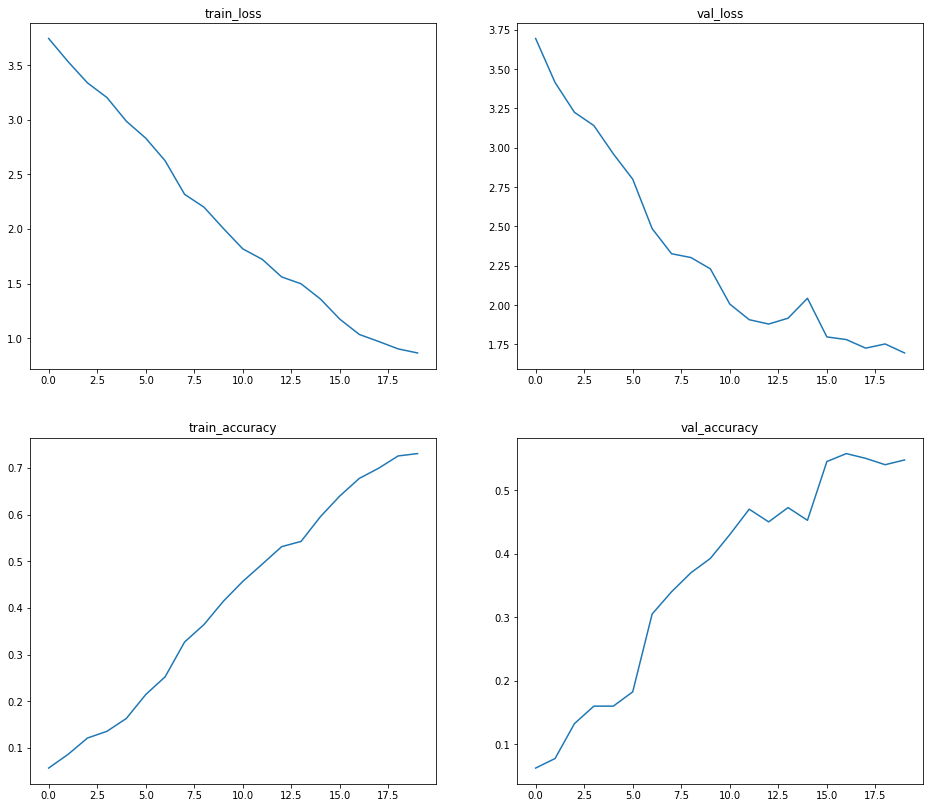

При тех же гиперпараметрах, но уже с батчнормой получились результаты ниже. Сильных скачки лоса и метрики говорит от том, что в первом случае модель учит более устойчивые и стабильные  закономерности, чем во втором. При относительной динамике на трейн и вал можно сказать, что модель переобучается. Можно было бы попробовать улучшить результат усилив методы регуляризации и аугментации, в частности. Но модель без батчнормы на данном этапе работает лучше, по-этому возьмем ее.

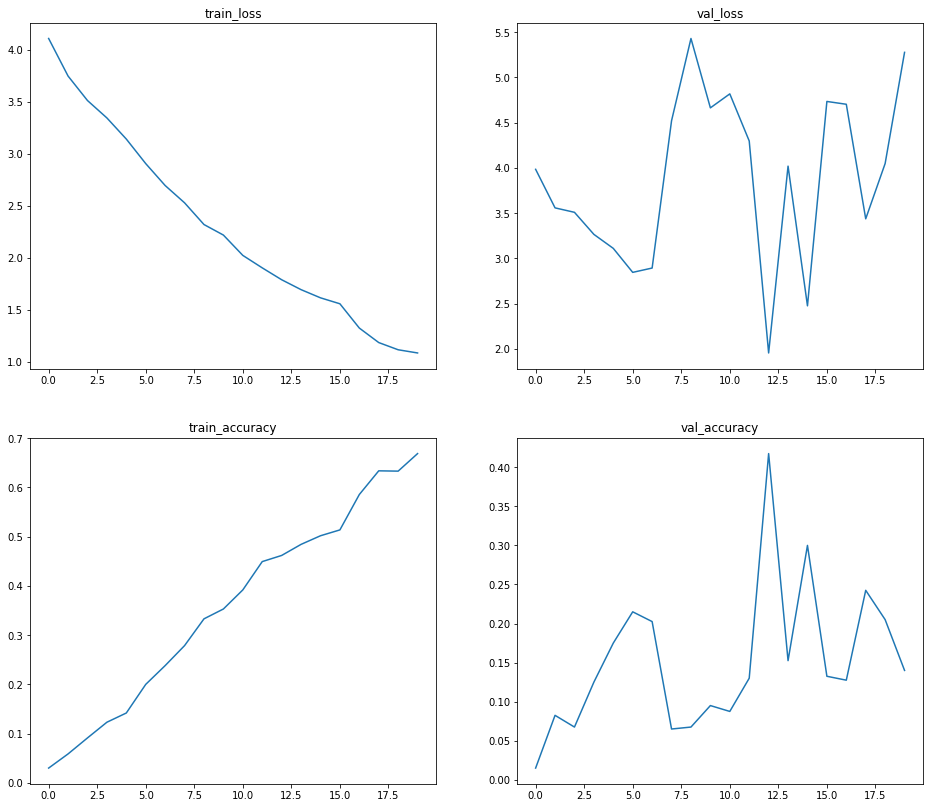

##### Анализ гиперпараметров регуляризации на MS

Посмотрим каким образом влияет различная степерь регуляризации на ранний этап обучения модели.

Далее я использовал VGG без бачнормы, и усилил методы регуляризации. Увеличил P в дропаутах с 0.4 до 0.5.

aug_chanse= 0.5, pitch_level= [-3, 3],normalnose_level= [0, 0.05],sound_up= [0.8, 1.2], stretch_level=[0.9, 1.1], sr= 44100, n_fft= 4410, hop_length= 308, n_mels= 128, n_mfcc= 32,
              shifttime_persent=0.2

при обучении с постоянным lr= 0.0001 при 20 эпохах, удалось достич следующего резульата

[Веса модели при необходимости](https://drive.google.com/file/d/10A5ENAyqmjWFXLoc0tfNpRZMM-85Wq4b/view?usp=sharing)


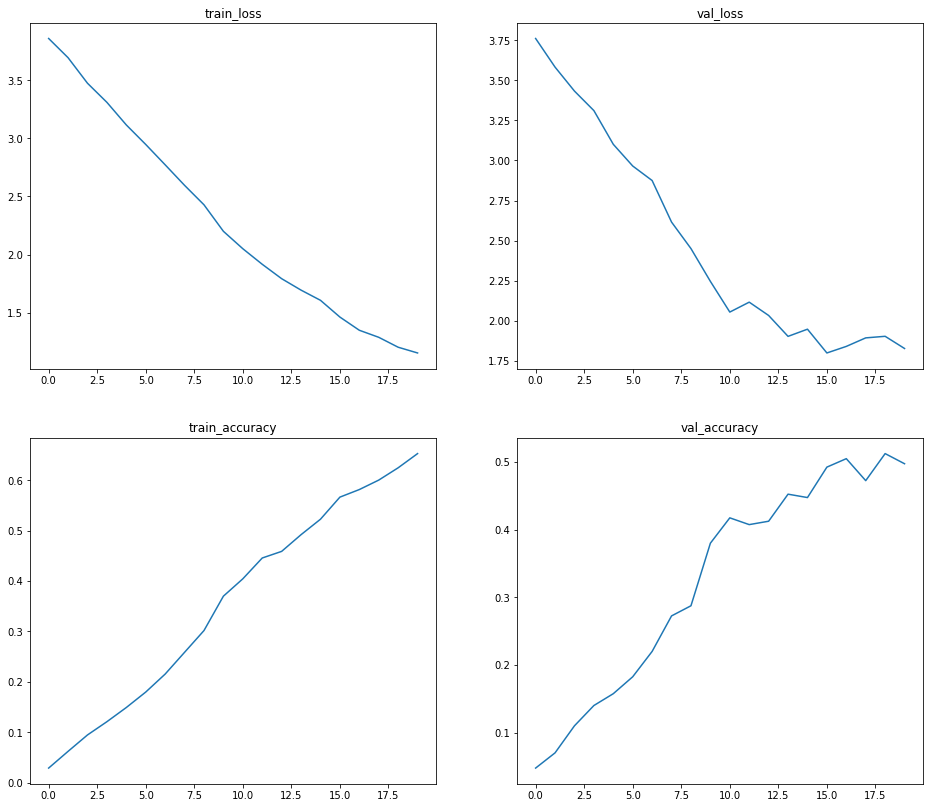

При

aug_chanse= 0.6, pitch_level= [-3, 3],normalnose_level= [0, 0.05],sound_up= [0.8, 1.2], stretch_level=[0.8, 1.2], sr= 44100, n_fft= 4410, hop_length= 308, n_mels= 128, n_mfcc= 32, shifttime_persent=0.2

Данные графики не сильно отличаются от предыдущих, учитывая, что не так сильно были поменяны гиперпараметры аугментации. Но если модель при более сильной аугментации данных способна показывать такую же Оценочную точность, то этот вариант более преспективен, так как модель переобучится с меньшей вероятностью.

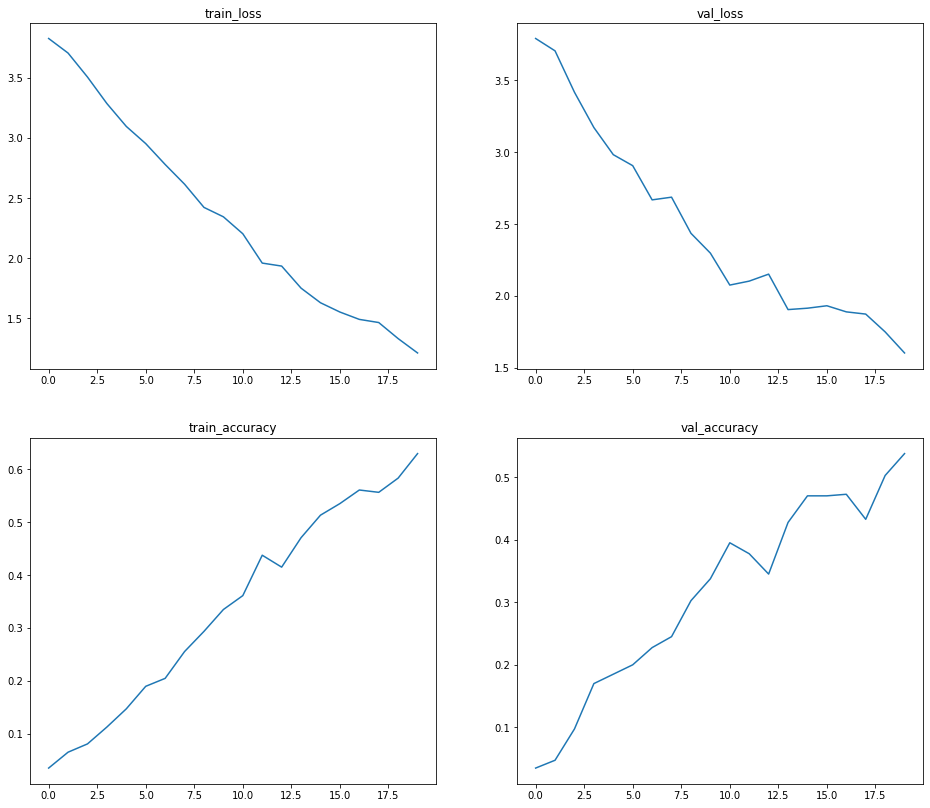

В следующем эксперементе я повысил шанс аугментации до 100%, получились следующие графики. Координальной разницы с двумя верхними случаями я не вижу. Модель не смотря на аугментации обучается находить верные закомерности, что следует из одинаковой динамики лосса и accuracy на вал и трейне частях. В дальнейшем я буду использовать шанс аугментации равный 60%, что позволит значительно снизить шанс переобучения, при этом 40% данных не аугментированы, что позволит, теоретически, сойтись модели более точно.
[Веса модели при необходимости](https:///drive.google.com/file/d/12NXfAuqIQVBHBtnVC1lPYQ2WHSfp7shx/view?usp=share_link)

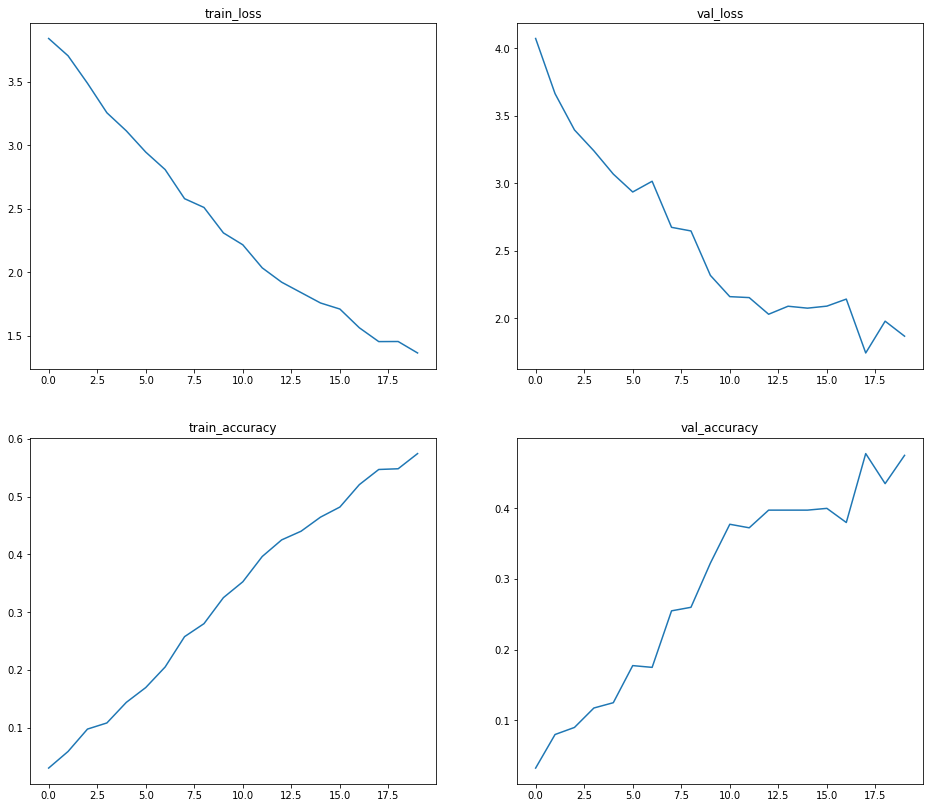

#### Обучение на MS представлении

Обучение происходит на видеокарте Tesla T4 в течении 10 эпох, с lr= 0.0001 с 1 до 8 эпохи, и lr=0.00001 с 9 до 10 эпохи.Кросс валидация была произведена с разделением на 5 фолдов и batch_size= 32.

Параметры MS спектрограмм:n_fft= 4410, hop_length= 308, n_mels= 128

Исходя из анализа выше были использованы следующий значения аугментаций:
aug_chance= 0.6, pitch_level=[-3, 3], normalnose_level= [0,0.05], stretch_level=[0.8, 1.2], sound_up= [0.8, 1.2]

Результаты вы можете видеть ниже на графике.

Использование кроссвалидации объяснено тем, что не хотелось отделять еще часть и так небольшого датасета, чтобы посмотреть на метрики, лоссы и, возможно, изменить гиперпараметры. На трейне это не делается для того, чтобы не подстраиваться под трейн выборку.

In [ ]:
def train_cross(model, optimizer, criterion, max_epoch, metric, X_train_val, y_train_val, scheduler, device,
                k_folds= 5, batch_size= 32, random_state= 42,
                transform_type= 'MS', n_fft= 4410, hop_length= 308, n_mels= 128, n_mfcc= 40,
                aug_chance= 0.6, pitch_level=[-3, 3], normalnose_level= [0,0.05], stretch_level=[0.8, 1.2], sound_up= [0.8, 1.2],
                shifttime_persent= 0.2):
  train_history_loss, val_history_loss= [], []
  train_history_metric, val_history_metric= [], []
  rs = ShuffleSplit(n_splits=k_folds, test_size=1/k_folds, random_state= random_state)

  for epoch in range(max_epoch):
    print(epoch+1)
    train_batch_counter, val_batch_counter= 0, 0
    train_loss, val_loss= 0, 0
    y_train_batch_predict, y_train_batch_true= [], []
    y_val_batch_predict, y_val_batch_true= [], []


    for train_indexes, val_indexes in rs.split(X_train_val):

      train_data= ESC50(X_train_val[train_indexes], y_train_val[train_indexes], transform_type=transform_type,
                        n_fft= n_fft, hop_length= hop_length, n_mels= n_mels, n_mfcc= n_mfcc,
                        aug_chance= aug_chance, pitch_level=pitch_level, normalnose_level= normalnose_level, 
                        stretch_level= stretch_level, sound_up=sound_up, shifttime_persent=shifttime_persent)

      val_data= ESC50(X_train_val[val_indexes], y_train_val[val_indexes], transform_type=transform_type, aug_chance= 0, n_fft= n_fft, hop_length= hop_length, n_mels= n_mels)
      # не забываем убрать аугментацию у VAL
      train_data_loader= DataLoader(train_data, batch_size= batch_size, shuffle= True, drop_last= True)
      val_data_loader= DataLoader(val_data, batch_size= batch_size, shuffle= True, drop_last= True)

      model.train()
      for x_batch, y_batch in tqdm(train_data_loader):
        x_batch= x_batch.to(device)
        y_batch= y_batch.to(device)

        optimizer.zero_grad()
        y_pred= model(x_batch)
        loss= criterion(y_pred, y_batch)
        loss.backward()
        optimizer.step()

        y_train_batch_predict+= torch.argmax(y_pred.to('cpu'), dim= 1) # дальше хотим посчитать метрику
        y_train_batch_true+= y_batch.to('cpu')
        train_loss+= loss.to('cpu')                                    # чтобы усредить лосс по всем батчам
        train_batch_counter+= 1



      model.eval()
      with torch.no_grad():
        for x_val_batch, y_val_batch in val_data_loader:
          x_val_batch= x_val_batch.to(device)
          y_val_batch= y_val_batch.to(device)

          y_val_pred= model(x_val_batch)

          y_val_batch_predict+= torch.argmax(y_val_pred.to('cpu'), dim= 1)
          y_val_batch_true+= y_val_batch.to('cpu')

          val_loss+= criterion(y_val_pred, y_val_batch).to('cpu')
          val_batch_counter+= 1

    clear_output()
    ##### конец кросс валидации ####
    scheduler.step()                             # scheduler
    with torch.no_grad():
      train_history_metric.append(metric(torch.stack(y_train_batch_predict), torch.stack(y_train_batch_true)))
      val_history_metric.append(metric(torch.stack(y_val_batch_predict), torch.stack(y_val_batch_true)))
      train_history_loss.append(train_loss/train_batch_counter) # усредняем лосс по всей кросс валидации
      val_history_loss.append(val_loss/val_batch_counter)

      if epoch+1% 5== 0: torch.save(model.state_dict(), '/content/gdrive/MyDrive/data/model/VGG16{0}_{MS}.pt'.format(epoch))

      history_plot(train_history_loss, train_history_metric, val_history_loss, val_history_metric, epoch)

  return  train_history_metric, val_history_metric, train_history_loss, val_history_loss

In [ ]:
device= 'cuda' if torch.cuda.is_available else 'cpu'
device

'cuda'

In [ ]:
lr= 1E-4
max_epoch= 10
model= Model(adappol_params= (3, 30)).to(device)
#criterion= nn.CrossEntropyLoss()
criterion= LogLoss()
#metric= multiclass_recall
metric= accuracy
optimizer= torch.optim.Adam(model.parameters(), lr= lr)
scheduler= MultiStepLR(optimizer, [9], gamma= 0.1)

In [ ]:
random_state= 42

data_downloader= Download_data()
data, targets= data_downloader.get_data()

X_train_val, X_test, y_train_val, y_test= train_test_split(data, targets, test_size= 0.2, shuffle= True, random_state= random_state)
print(len(X_train_val), len(y_train_val), len(X_test), len(y_test))

1600 1600 400 400


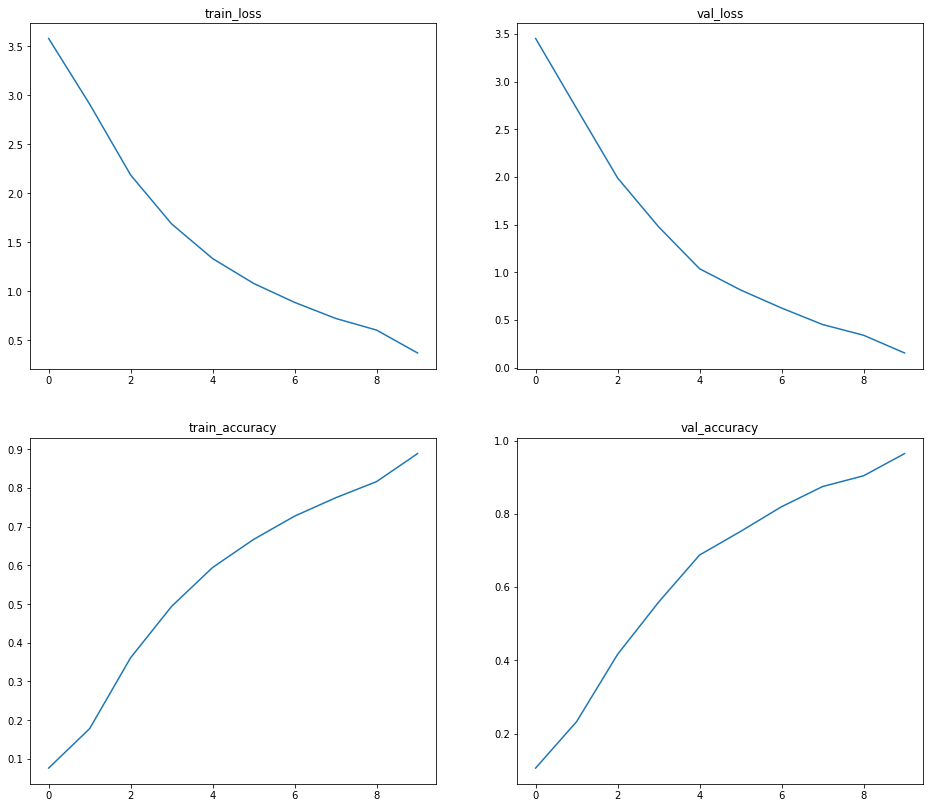

In [ ]:
train_metric, val_metric, train_loss, val_loss= train_cross(model, optimizer, criterion, max_epoch, metric, X_train_val, y_train_val, scheduler, device,
                k_folds= 5, batch_size= 32, random_state= 42,
                transform_type= 'MS', n_fft= 4410, hop_length= 308, n_mels= 128, n_mfcc= 40,
                aug_chance= 0.6, pitch_level=[-3, 3], normalnose_level= [0,0.05], stretch_level=[0.8, 1.2], sound_up= [0.8, 1.2]
                )


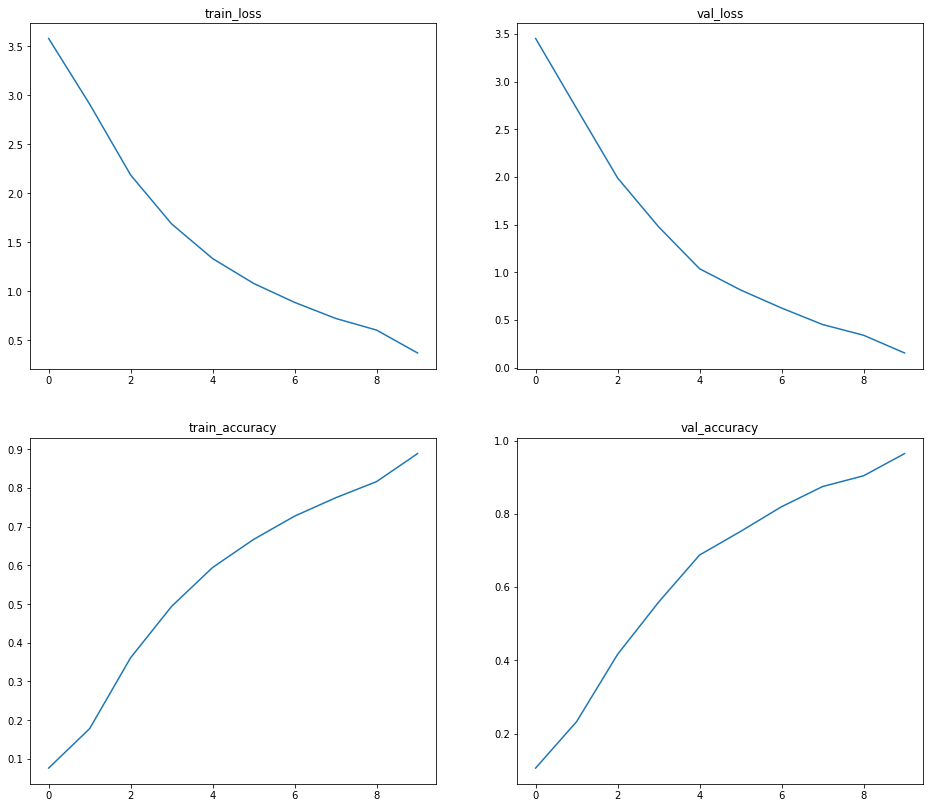

In [ ]:
torch.save(model.state_dict(), '/content//VGG16{0}_{MS}.pt')

Посмотрим метрику на тестовой выборке. Высокая метрика на вал выборке связана с тем, что модель "видела" объекты, которые находятся в Val части, когда она обучалась в процессе кросс валидации. По-этому, Val метрика не очень объективна.

In [ ]:
with torch.no_grad():
  test_data= ESC50(X_test, y_test, transform_type= 'MS', aug_chance= 0, n_fft= 4410, hop_length= 308, n_mels= 128 )
  test_data_loader= DataLoader(test_data, batch_size= 20)
  y_train_batch_predict= []
  y_train_batch_true= []
  for x_batch, y_batch in test_data_loader:
    x_batch= x_batch.to(device)
    y_pred= model(x_batch)
    y_train_batch_predict+= torch.argmax(y_pred.to('cpu'), dim= 1) # дальше хотим посчитать метрику
    y_train_batch_true+= y_batch.to('cpu')

  y_train_batch_predict= torch.stack(y_train_batch_predict)
  y_train_batch_true= torch.stack(y_train_batch_true)


In [ ]:
with torch.no_grad():
  print(len(y_train_batch_predict), len(y_train_batch_true))
  print(accuracy(y_train_batch_predict, y_train_batch_true))

400 400
tensor(0.6300)




```
 400 400
tensor(0.6300)
```



Веса модели после предыдущего обучения можно найти здесь: [Веса модели](https://drive.google.com/file/d/1DEsLFiHVPcI2N0gH702_YI9IbHE8UWeB/view?usp=share_link)

In [ ]:
#model.load_state_dict(torch.load('/content/VGG16{0}_{MS}.pt'))

Следующим шагом было принято решение доучить модель при большей аугментации. Возможно получится достичь больщей точности. Количество эпох равно 10, lr= 0.0001, который будет уменьшен после 9 эпохи в 10 раз. Остальные параметры аналогичны.

In [ ]:
lr= 1E-4
max_epoch= 5
criterion= nn.CrossEntropyLoss()
#criterion= LogLoss()
metric= multiclass_recall
scheduler= MultiStepLR(optimizer, [15], gamma= 0.1)

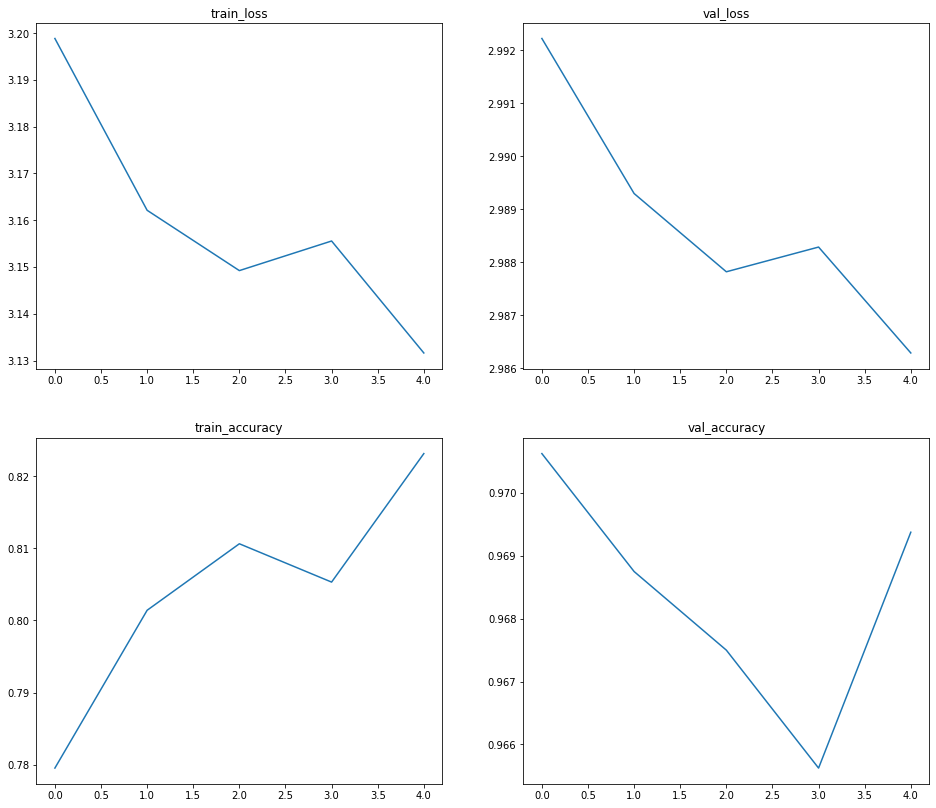

In [ ]:
train_metric, val_metric, train_loss, val_loss= train_cross(model, optimizer, criterion, max_epoch, metric, X_train_val, y_train_val, scheduler, device,
                k_folds= 5, batch_size= 32, random_state= 42,
                transform_type= 'MS', n_fft= 4410, hop_length= 308, n_mels= 128, n_mfcc= 40,
                aug_chance= 1, pitch_level=[-4, 4], normalnose_level= [0,0.15], stretch_level=[0.7, 1.3], sound_up= [0.7, 1.3], shifttime_persent= 0.25
                )

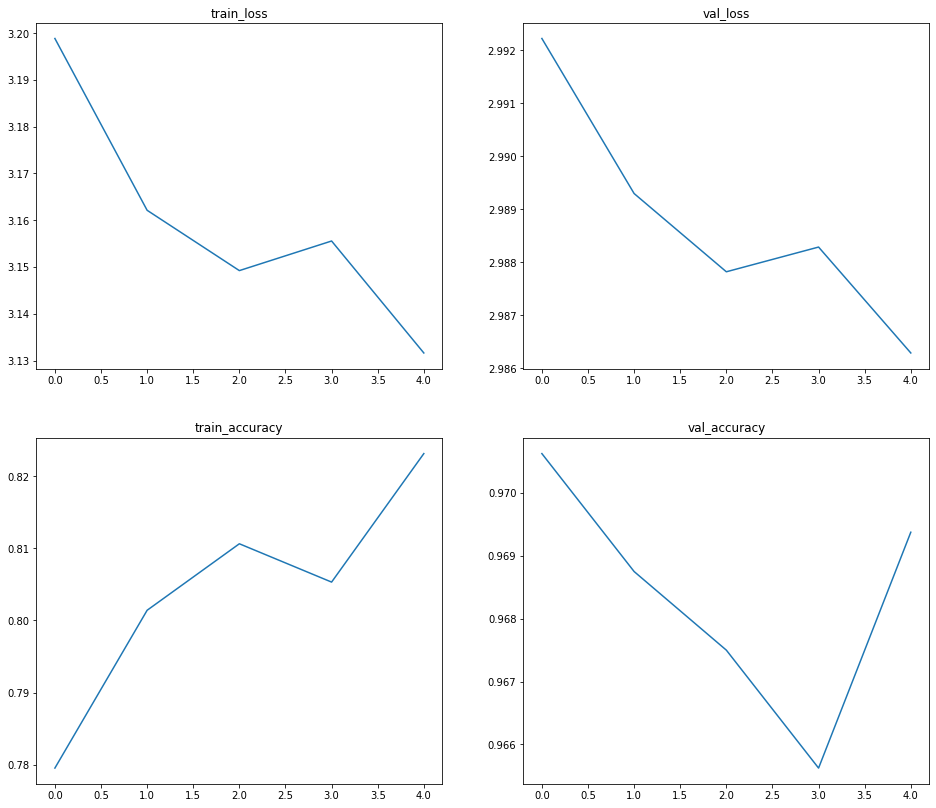

In [ ]:
with torch.no_grad():
  test_data= ESC50(X_test, y_test, transform_type= 'MS', aug_chance= 0, n_fft= 4410, hop_length= 308, n_mels= 128 )
  test_data_loader= DataLoader(test_data, batch_size= 20)
  y_train_batch_predict= []
  y_train_batch_true= []
  for x_batch, y_batch in test_data_loader:
    x_batch= x_batch.to(device)
    y_pred= model(x_batch)
    y_train_batch_predict+= torch.argmax(y_pred.to('cpu'), dim= 1) # дальше хотим посчитать метрику
    y_train_batch_true+= y_batch.to('cpu')

  y_train_batch_predict= torch.stack(y_train_batch_predict)
  y_train_batch_true= torch.stack(y_train_batch_true)
  print(len(y_train_batch_predict), len(y_train_batch_true))
  print(accuracy(y_train_batch_predict, y_train_batch_true))

400 400
tensor(0.6275)


In [ ]:
torch.save(model.state_dict(), '/content/VGG16{PosleReg}_{MS}.pt')

После применения такой аугментации видно, что модель с ней справляется и ее можно усилить еще. Как уже было сказано выше, модель видела Вал выборку, по-этому, метрика на ней не объективно и нельзя точно сказать про то насколько модель переобучается.

Обучим модель заново уже без кросвалидации. По вал части сложно понять переобучается ли модель, по-этому будем считать метрику на трейн и тест части. При этом, благодаря предыдущим экспериментам, я понял, что модель хорошо справляется с "сильной" аугментацией. Было принято решение обучать модель при aug_chance= 1, pitch_level= [-3, 3], normalnose_level= [0, 0.10],sound_up= [0.7, 1.3], stretch_level=[0.7, 1.3]

In [ ]:
lr= 1E-4
max_epoch= 40
model= Model(adappol_params= (3, 30)).to(device)
#criterion= nn.CrossEntropyLoss()
criterion= LogLoss()
#metric= multiclass_recall
metric= accuracy
optimizer= torch.optim.Adam(model.parameters(), lr= lr)
scheduler= MultiStepLR(optimizer, [41], gamma= 0.1)

In [ ]:
random_state= 42

data_downloader= Download_data()
data, targets= data_downloader.get_data()

X_train, X_test, y_train, y_test= train_test_split(data, targets, test_size= 0.2, shuffle= True, random_state= random_state)
print(len(X_train), len(y_train), len(X_test), len(y_test))

1600 1600 400 400


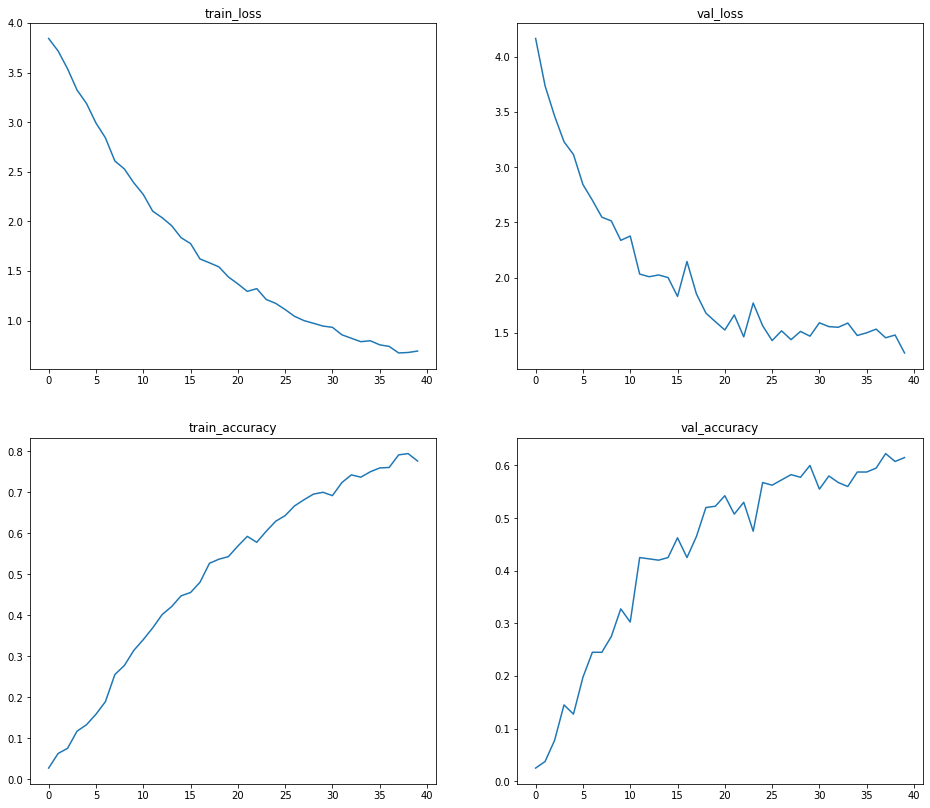

In [ ]:
train_data_loader= DataLoader(ESC50(X_train, y_train, aug_chance= 1, pitch_level= [-3, 3], normalnose_level= [0, 0.10],sound_up= [0.7, 1.3], stretch_level=[0.7, 1.3] ), batch_size= 32, shuffle= True)
val_data_loader=  DataLoader(ESC50(X_test, y_test, aug_chance= 0), batch_size= 32, shuffle= True)

train_metric, val_metric, train_loss, val_loss= train(model= model, optimizer= optimizer, criterion=criterion, max_epoch= max_epoch, metric= metric, train_data_loader= train_data_loader,
       val_data_loader= val_data_loader, scheduler= scheduler, device= device,  batch_size= 32, random_state= 42)


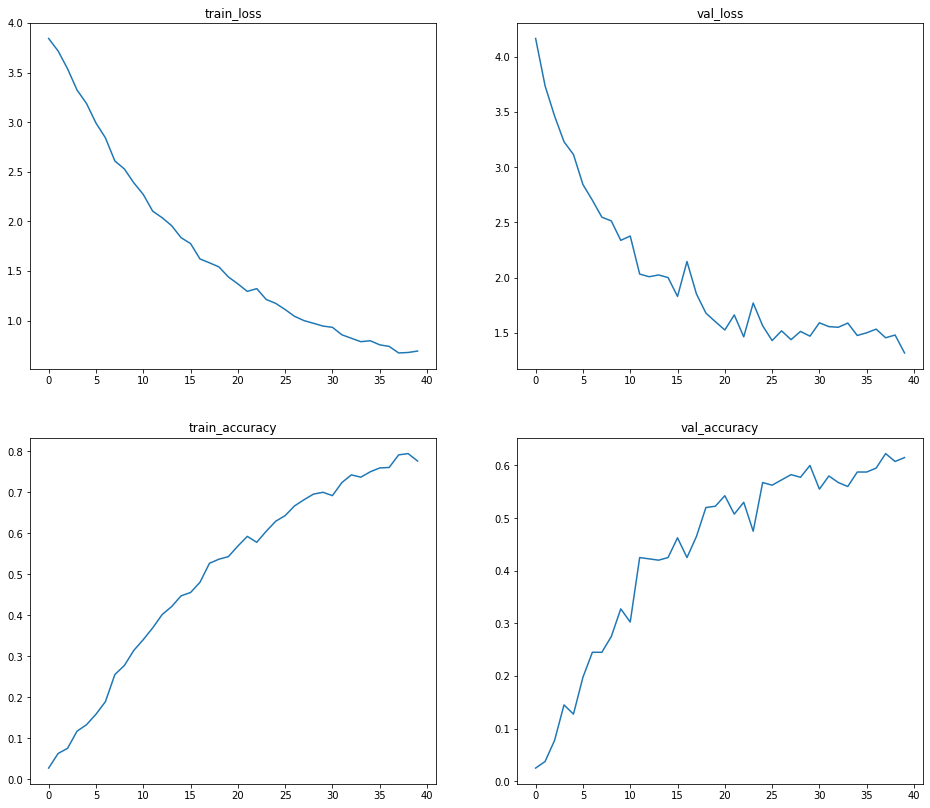

Графики лосса и точности для тест и трейн выборки имеют схожую динамику убывания и возрастания соответственно, что говорит о том, что модель учит закономерности и нет сильно выраженного переобучения.

Скачать весы для модели можно тут: [Веса](https://drive.google.com/file/d/1-7U65IfNjiyyFDUgA2P1fDgu5dp3irqM/view?usp=share_link)

Попробуем дообучить модель на lr= 1E-5.

In [ ]:
torch.save(model.state_dict(), '/content/VGG16{train_test}_{MS}.pt')

In [ ]:
lr= 1E-5
max_epoch= 10

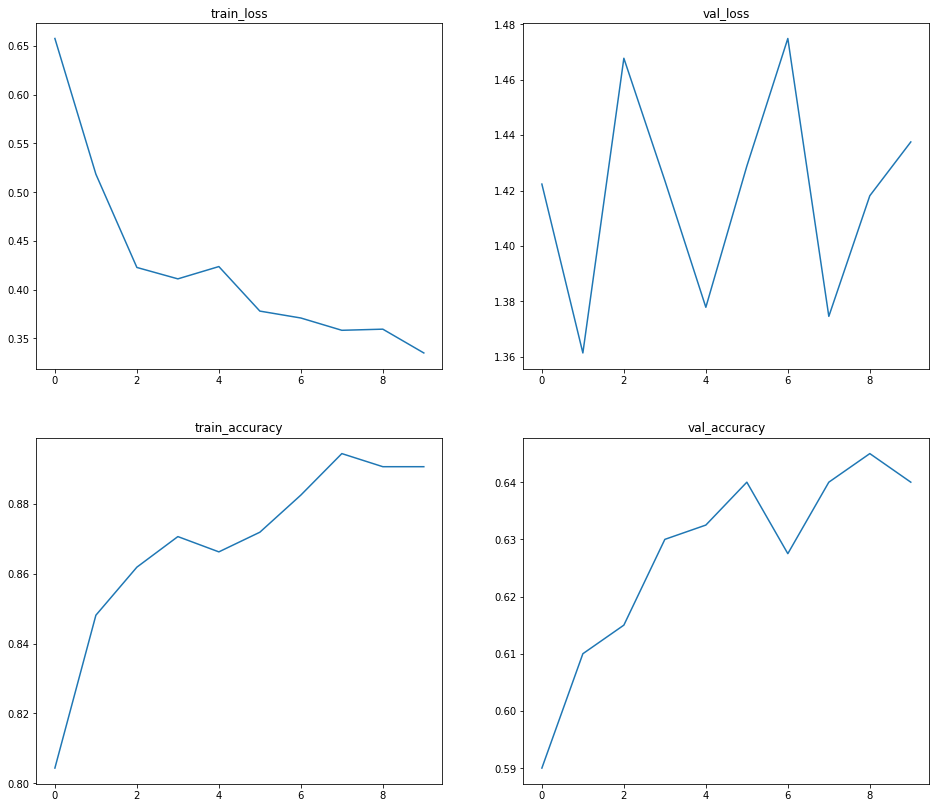

In [ ]:
train_metric, val_metric, train_loss, val_loss= train(model= model, optimizer= optimizer, criterion=criterion, max_epoch= max_epoch, metric= metric, train_data_loader= train_data_loader,
       val_data_loader= val_data_loader, scheduler= scheduler, device= device, batch_size= 32, random_state= 42)


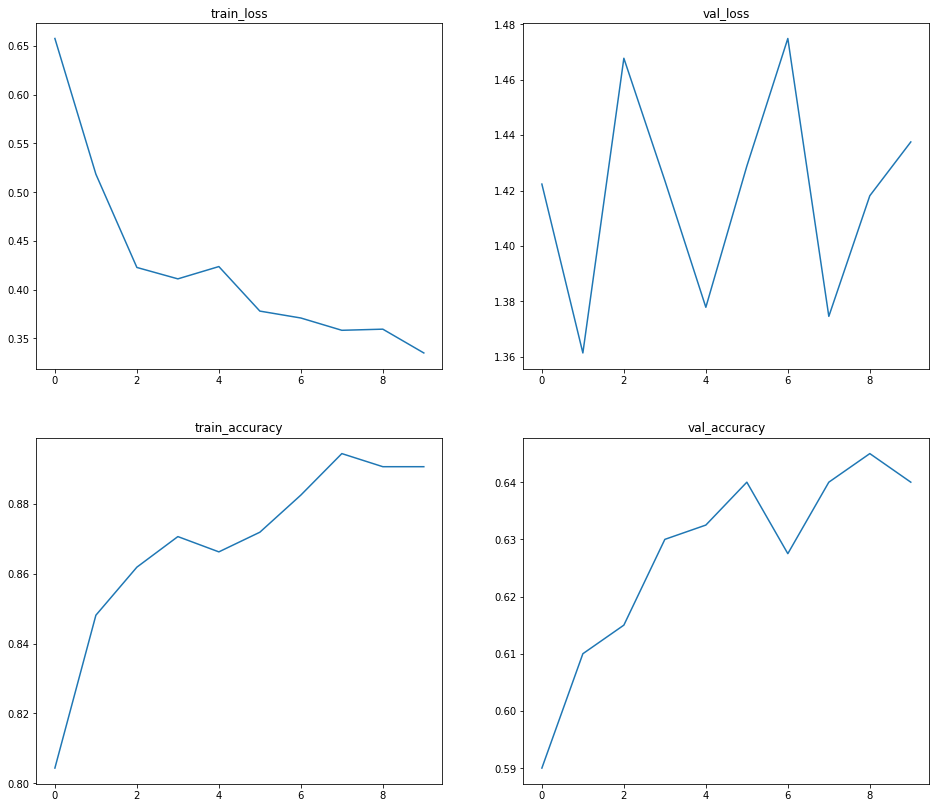

Веса можно скачать тут: [Веса](https://drive.google.com/file/d/1-Bw7Z1FyjsgIcuLjAwvSs9R0OwJyIjsO/view?usp=share_link)

In [ ]:
torch.save(model.state_dict(), '/content/VGG16{2}_{MS}.pt')

In [ ]:
print(val_metric[-1])

tensor(0.6400)


Посмотрим, какие классы модель хорошо предсказывает, а какие плохо. Нельзя смотреть тест, иначе будет подгонка параметров.

In [ ]:
data_loader=  DataLoader(ESC50(X_train, y_train, aug_chance= 0), batch_size= 32, shuffle= True)
with torch.no_grad():
  y_check= np.zeros(50)
  y_count= np.zeros(50)
  for x, y in data_loader:
    x= x.to(device)
    y_pred=  torch.argmax(model(x), dim=1)

    for idx, item in enumerate(y):
      y_count[item]+=1
      if item== y_pred[idx]:
        y_check[item]+= 1


In [ ]:
y_check/y_count

array([0.94117647, 1.        , 0.93548387, 1.        , 0.96551724,
       1.        , 1.        , 0.88235294, 0.93333333, 1.        ,
       0.97142857, 1.        , 0.96774194, 1.        , 1.        ,
       0.96153846, 0.93548387, 1.        , 1.        , 0.93939394,
       0.97142857, 1.        , 1.        , 0.9375    , 0.93333333,
       1.        , 0.83333333, 1.        , 1.        , 0.84848485,
       1.        , 0.89655172, 0.97058824, 0.90909091, 1.        ,
       0.72413793, 0.84615385, 1.        , 0.88571429, 0.97142857,
       0.67857143, 0.97222222, 1.        , 0.94594595, 0.87096774,
       0.7       , 1.        , 0.65625   , 0.7       , 0.9375    ])

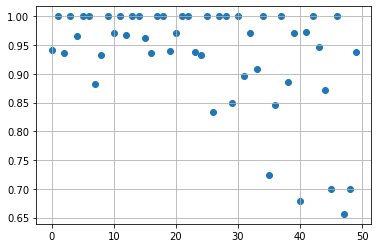

In [ ]:
plt.scatter(np.arange(0, 50), y_check/y_count)
plt.grid()
plt.show()

Видно, из 40 объектов классос хуже всего модель предсказывает 48, 47, 45, 40, 35 классы. Дополнительно накажем модель за плохие предсказания на этих классах.

In [ ]:
class LogLossSpecial(nn.Module):
  def __init__(self, class_indexes):
    super().__init__()
    self.class_indexes= class_indexes

  def forward(self, y_pred, y_true):
    loss= 0
    for idx in range(len(y_true)):
      if y_true[idx] in self.class_indexes:
        loss-= 5*torch.log(y_pred[idx, y_true[idx]]+0.0001)
      else:
        loss-= torch.log(y_pred[idx, y_true[idx]]+0.0001)
    return loss/len(y_true)


In [ ]:
lr= 1E-5
max_epoch= 5
criterion= LogLossSpecial([48, 47, 45, 40, 35])

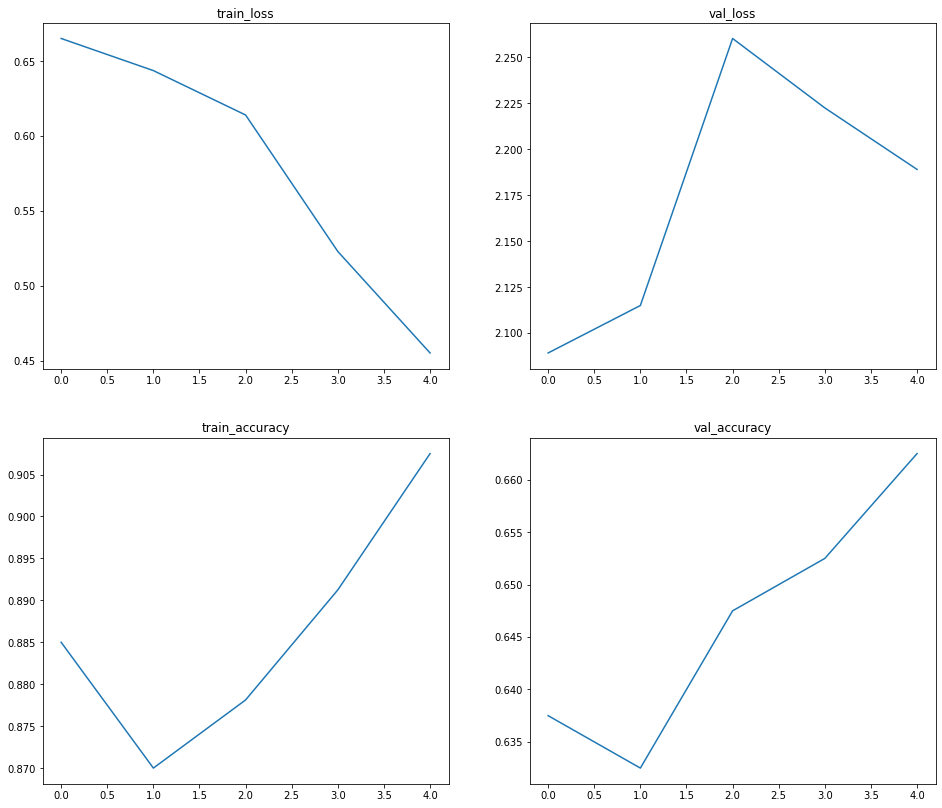

In [ ]:
train_metric, val_metric, train_loss, val_loss= train(model= model, optimizer= optimizer, criterion=criterion, max_epoch= max_epoch, metric= metric, train_data_loader= train_data_loader,
       val_data_loader= val_data_loader, scheduler= scheduler, device= device, batch_size= 32, random_state= 42)


In [ ]:
torch.save(model.state_dict(), '/content/VGG16{3}_{MS}.pt')

[ПОСЛЕДНИЕ Веса!!!](https://drive.google.com/file/d/1-H7HrG9uyVZfpF58ie514HW3b9T3r5Wy/view?usp=share_link)

Видим увеличение точности на 2%. Попробуем посмотреть еще раз на точность определения каждого из классов.

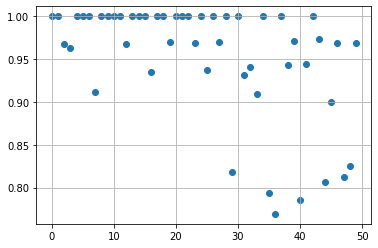

In [ ]:
data_loader=  DataLoader(ESC50(X_train, y_train, aug_chance= 0), batch_size= 32, shuffle= True)
with torch.no_grad():
  y_check= np.zeros(50)
  y_count= np.zeros(50)
  for x, y in data_loader:
    x= x.to(device)
    y_pred=  torch.argmax(model(x), dim=1)

    for idx, item in enumerate(y):
      y_count[item]+=1
      if item== y_pred[idx]:
        y_check[item]+= 1
y_check/y_count

plt.scatter(np.arange(0, 50), y_check/y_count)
plt.grid()
plt.show()

In [ ]:
lr= 1E-5
max_epoch= 5
criterion= LogLossSpecial([48, 47, 45, 40, 35, 29, 44])

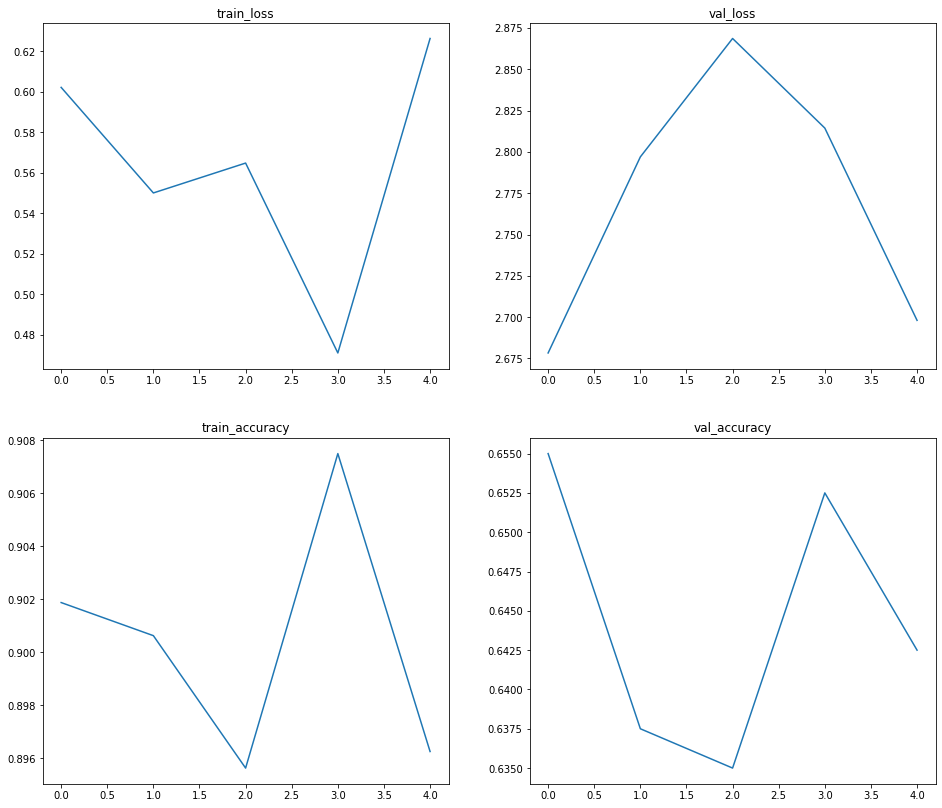

In [ ]:
train_metric, val_metric, train_loss, val_loss= train(model= model, optimizer= optimizer, criterion=criterion, max_epoch= max_epoch, metric= metric, train_data_loader= train_data_loader,
       val_data_loader= val_data_loader, scheduler= scheduler, device= device, batch_size= 32, random_state= 42)


Результат особо не изменился, оставим модель с предыдущими весами.

#### Обучение на MFCC представлении

Изначально, я предполагаю, что результаты для MFCC будут хуже. MFCC - это не спектрограммы (частота-время), а "кепстрограммы" (время-кепструм). MFCC может быть не таким хорошим представлением для типичных 2D CNN, которые применяются к спектрограммам. Это связано с тем, что локальность была уменьшена: в MFCC частоты,ранее близкие друг к другу, больше не находятся рядом друг с другом по вертикальной оси. И поскольку 2D CNN имеют ядра с ограниченной локальностью (3x3) , это может снизить производительность модели. И при использовании сильной регуляризации на сегнали модель может совсем ничего не выучить. А при слабой аугментации имеет довольно большой шанс переобучится.

Как уже было сказано, валидировать модель на Тест части не очень хорошая идея с той стороны, что таким образом мы подстраиваемся под тестовую выборку. Но это именно так мы поймем, как обучается модель.

Посмотрим переобучатся ли модель при нулевой аугментации.

In [ ]:
lr= 1E-4
max_epoch= 50
model= Model(adappol_params= (2, 30)).to(device)
#criterion= nn.CrossEntropyLoss()
criterion= LogLoss()
#metric= multiclass_recall
metric= accuracy
optimizer= torch.optim.Adam(model.parameters(), lr= lr)
scheduler= MultiStepLR(optimizer, [40], gamma= 0.1)

In [ ]:
random_state= 42

data_downloader= Download_data()
data, targets= data_downloader.get_data()

X_train, X_test, y_train, y_test= train_test_split(data, targets, test_size= 0.2, shuffle= True, random_state= random_state)
print(len(X_train), len(y_train), len(X_test), len(y_test))

1600 1600 400 400


In [ ]:
train_data_loader= DataLoader(ESC50(X_train, y_train, aug_chance= 0, transform_type= 'MFCC',n_mfcc= 40, pitch_level= [-3, 3], normalnose_level= [0, 0.10],sound_up= [0.8, 1.2], stretch_level=[0.7, 1.3] ), batch_size= 32, shuffle= True)
val_data_loader=  DataLoader(ESC50(X_test, y_test, aug_chance= 0,transform_type= 'MFCC', n_mfcc= 40), batch_size= 32, shuffle= True)

train_metric, val_metric, train_loss, val_loss= train(model= model, optimizer= optimizer, criterion=criterion, max_epoch= max_epoch, metric= metric, train_data_loader= train_data_loader,
       val_data_loader= val_data_loader, scheduler= scheduler, device= device,  batch_size= 32, random_state= 42)


Данные получены при обучении в течении 50 эпох на MFCC представлении с нулевой вероятностью аугментации на трейн данных.

batch_size=32, n_mfcc= 40, lr= 0.0001

Слева на графике изображена информация о Трейн части, справа о Тест части.

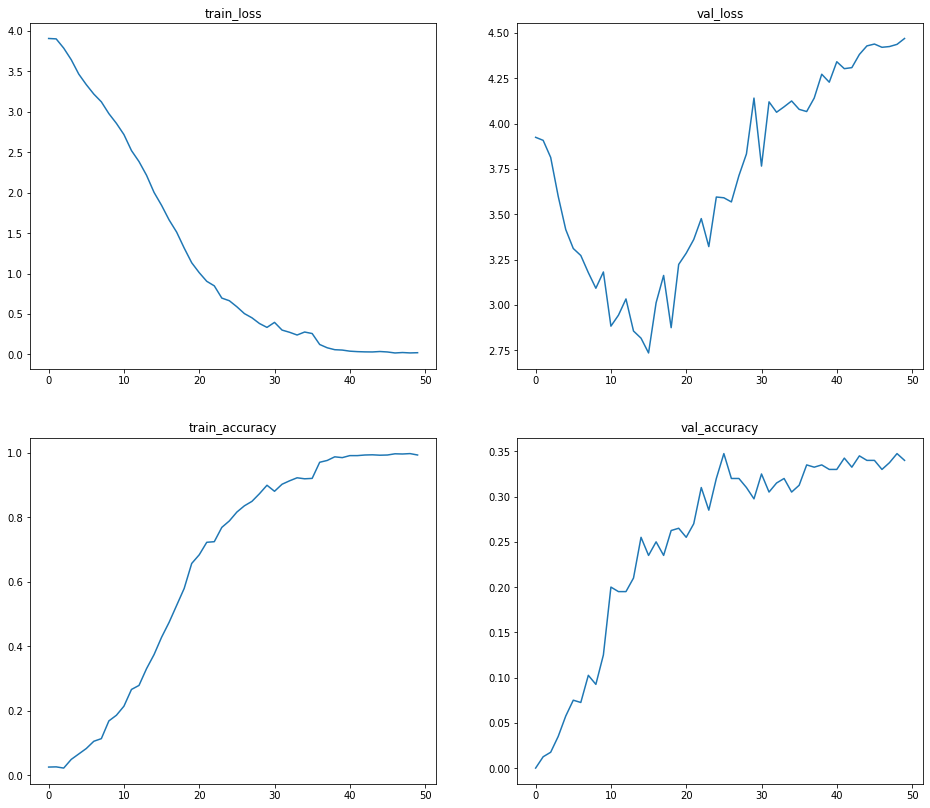

Смущает такое поведение функций, лолгичного объяснения не нашел. Но как мне кажется, модель начала переобучаться начиная с 15 эпохи, при этом метрика не падала, так как модель продолжала угадывать часть объектов тест выборки, схожих с трейн объектами. Попробуем добавить регуляризации.

При aug_chance= 0.5, transform_type= 'MFCC',n_mfcc= 40, pitch_level= [-3, 3], normalnose_level= [0, 0.10],sound_up= [0.8, 1.2], stretch_level=[0.8, 1.2] при LogLoss() графики обучения находятся ниже.

Я не исключал, что проблемы могут быть в Loss функции, по-этому решил обучить при тех же параметрах, но на nn.CrossEntropyLoass

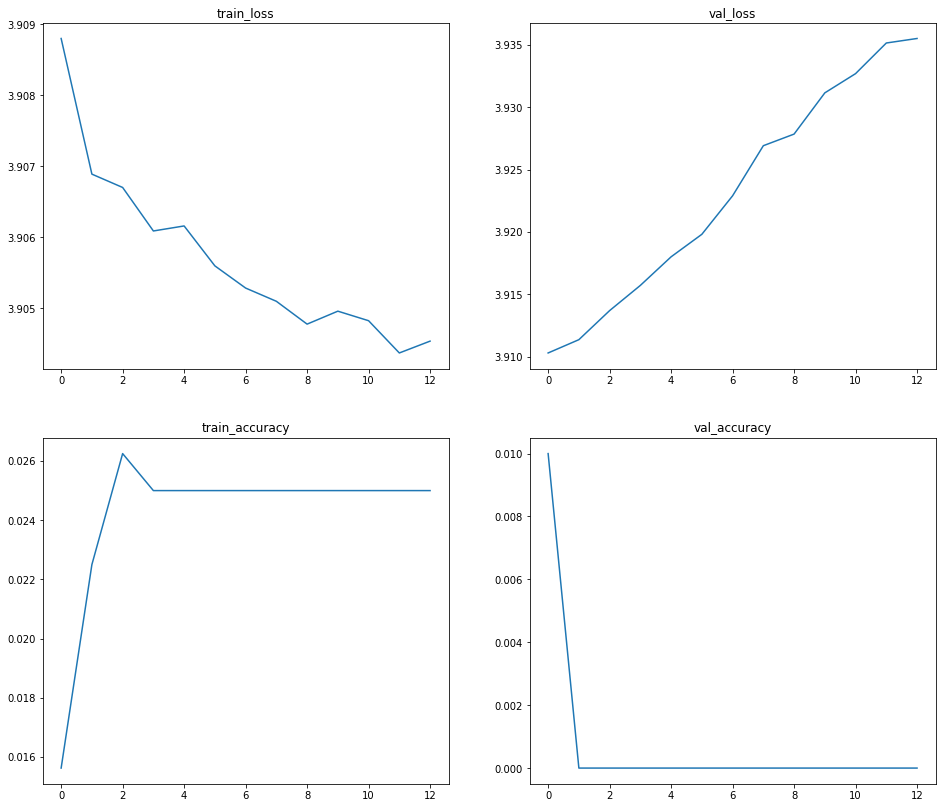

Вот что я получил при nn.CrossEntropyLoss. Модель не хочет учить закономерности. Вероятно, что малые преобразования дискритизированного сигнала сильно преобразуют MFCC, по-этому модель не учится.

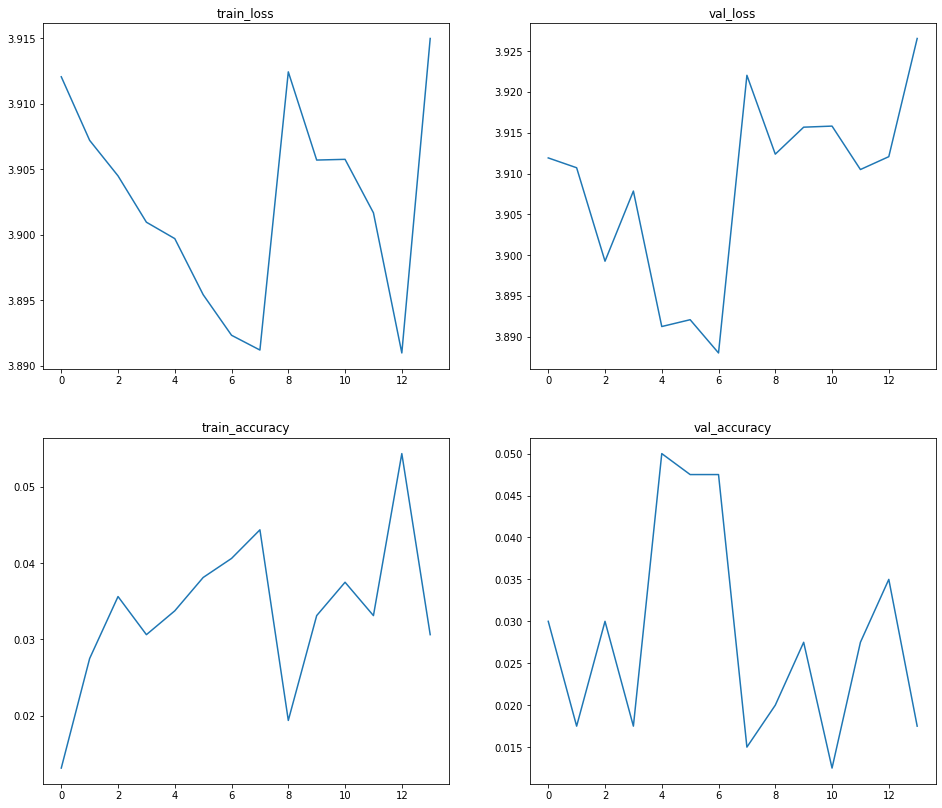

Попробуем ослабить аугментации, связанные с изменение амплитуд звука, так как они сильно меняют MFCC фичмапу после примения (близкие частоты разнесены).

На 10 эпохах при lr= 1E-4, aug_chance= 0.2, transform_type= 'MFCC',n_mfcc= 40, pitch_level= [-1, 1], normalnose_level= [0, 0.02],sound_up= [0.9, 1.1], stretch_level=[1, 1].

In [ ]:
lr= 1E-4
max_epoch= 10

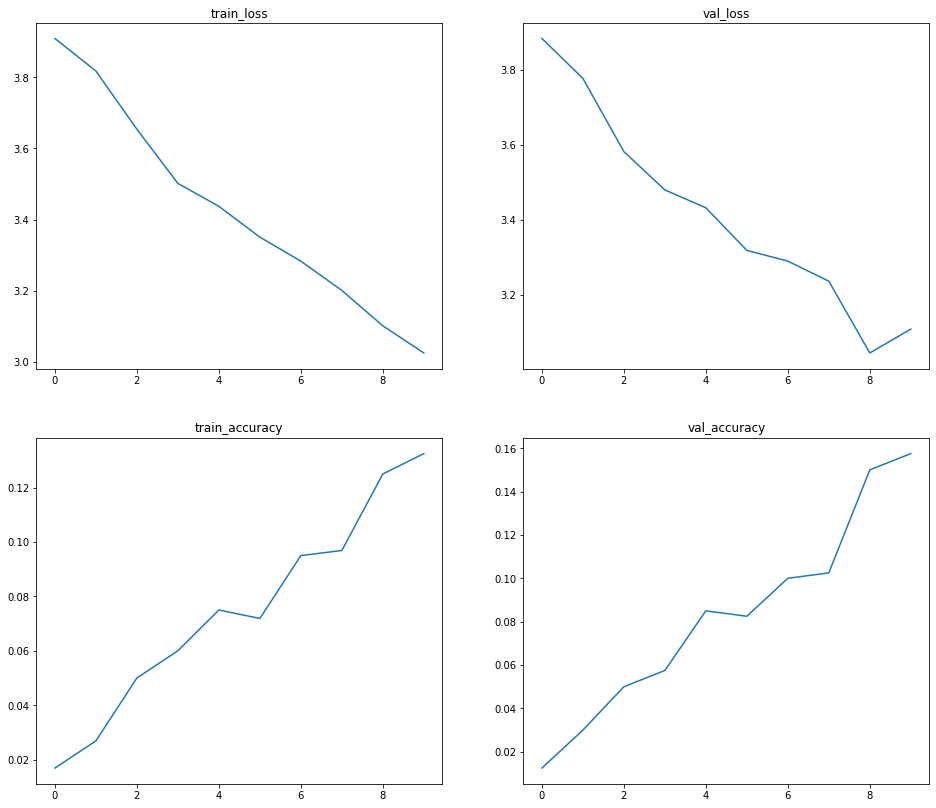

In [ ]:
train_data_loader= DataLoader(ESC50(X_train, y_train, aug_chance= 0.2, transform_type= 'MFCC',n_mfcc= 40, pitch_level= [-1, 1], normalnose_level= [0, 0.02],sound_up= [0.9, 1.1], stretch_level=[1, 1] ), batch_size= 32, shuffle= True)
val_data_loader=  DataLoader(ESC50(X_test, y_test, aug_chance= 0,transform_type= 'MFCC', n_mfcc= 40), batch_size= 32, shuffle= True)

train_metric, val_metric, train_loss, val_loss= train(model= model, optimizer= optimizer, criterion=criterion, max_epoch= max_epoch, metric= metric, train_data_loader= train_data_loader,
       val_data_loader= val_data_loader, scheduler= scheduler, device= device,  batch_size= 32, random_state= 42)


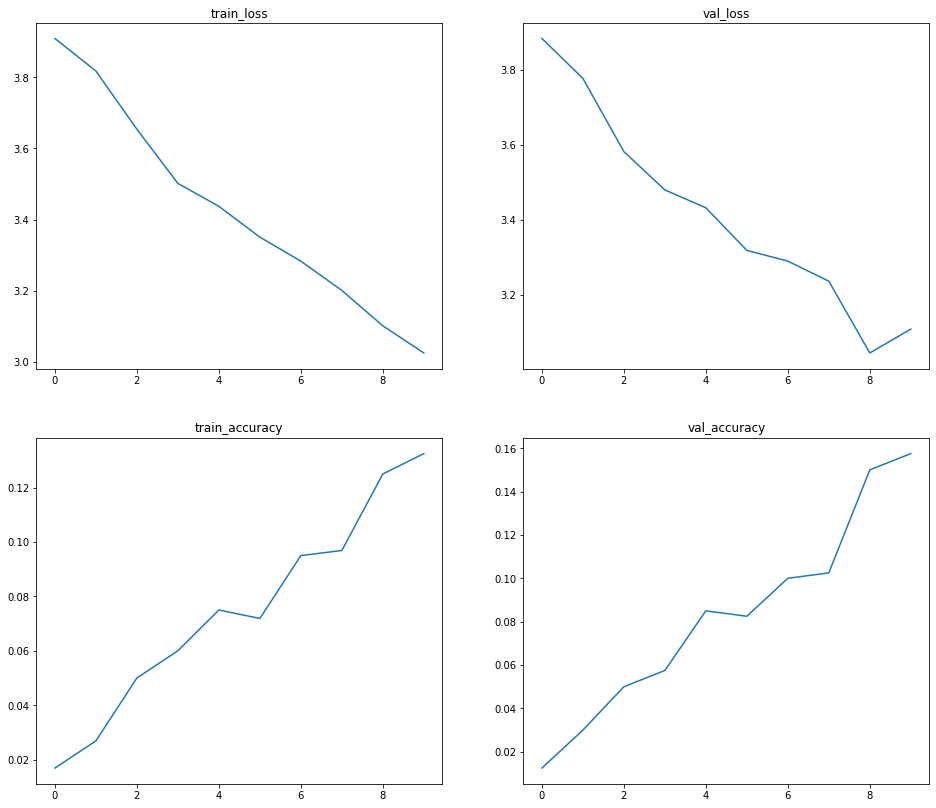

In [ ]:
lr= 1E-4
max_epoch= 30

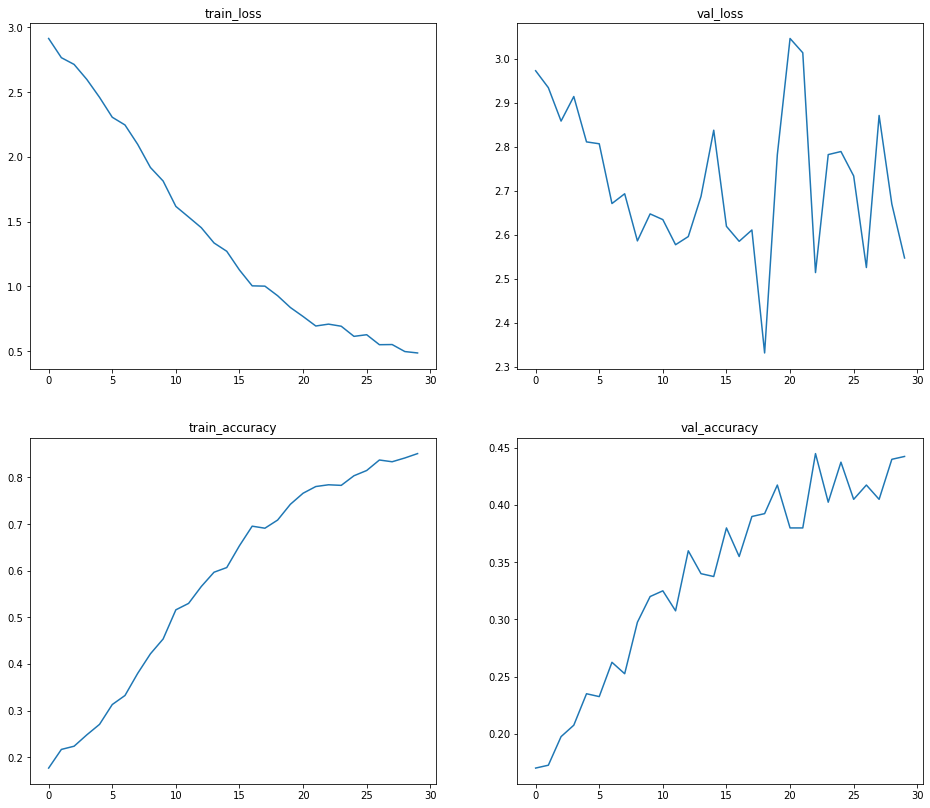

In [ ]:
train_data_loader= DataLoader(ESC50(X_train, y_train, aug_chance= 0.2, transform_type= 'MFCC',n_mfcc= 40, pitch_level= [-1, 1], normalnose_level= [0, 0.02],sound_up= [0.9, 1.1], stretch_level=[1, 1] ), batch_size= 32, shuffle= True)
val_data_loader=  DataLoader(ESC50(X_test, y_test, aug_chance= 0,transform_type= 'MFCC', n_mfcc= 40), batch_size= 32, shuffle= True)

train_metric, val_metric, train_loss, val_loss= train(model= model, optimizer= optimizer, criterion=criterion, max_epoch= max_epoch, metric= metric, train_data_loader= train_data_loader,
       val_data_loader= val_data_loader, scheduler= scheduler, device= device,  batch_size= 32, random_state= 42)


Модель обучается, но довольно нестабильно, что видно по перепадам лосс функции и метрики. Но при этом модели удается распознавать объекты выборки. Нестабильность может быть связана с сильным изменеием объектов при аугментации, при этом из-за слабой аугментации переобучение выше, тк объектов выборки не так много.

[Веса на 10+ 30 эпохах](https://drive.google.com/file/d/1-bzoOkNzG9egj1X6jySIeIGGVnk4oN2T/view?usp=share_link)

In [ ]:
val_metric[-1]

tensor(0.4425)

tensor(0.4425)

#### Обучение на S представлении

Я посчитал, что S представление должно, в отличиие от MFCC, схожим с MS образом реагировать на аугментацию (например при измении частов в MFCC сильно меняется конечная картинка), по-этому решил обучить модель при тех же значения регуляризации, что и MS.

In [ ]:
device= 'cuda' if torch.cuda.is_available else 'cpu'

In [ ]:
lr= 1E-4
max_epoch= 50
model= Model(adappol_params= (5, 15)).to(device)
#criterion= nn.CrossEntropyLoss()
criterion= LogLoss()
#metric= multiclass_recall
metric= accuracy
optimizer= torch.optim.Adam(model.parameters(), lr= lr)
scheduler= MultiStepLR(optimizer, [40], gamma= 0.1)

In [ ]:
random_state= 42

data_downloader= Download_data()
data, targets= data_downloader.get_data()

X_train, X_test, y_train, y_test= train_test_split(data, targets, test_size= 0.2, shuffle= True, random_state= random_state)
print(len(X_train), len(y_train), len(X_test), len(y_test))

1600 1600 400 400


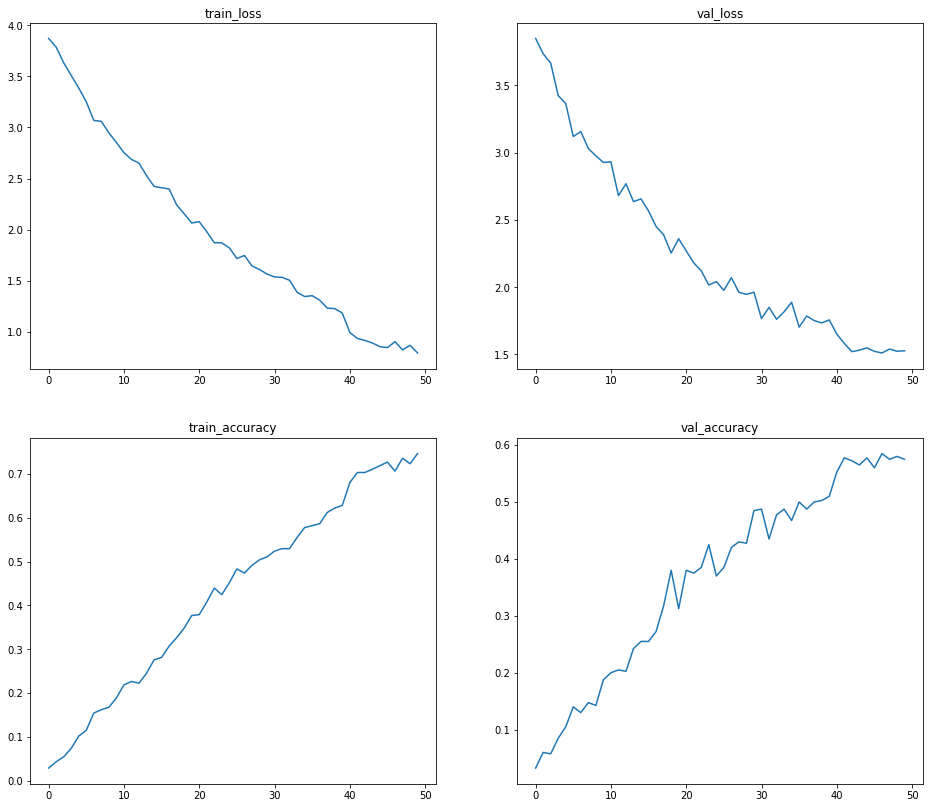

In [ ]:
train_data_loader= DataLoader(ESC50(X_train, y_train, aug_chance= 1, transform_type= 'S',n_mfcc= 40, pitch_level= [-3, 3], normalnose_level= [0, 0.10],sound_up= [0.7, 1.3], stretch_level=[0.7, 1.3] ), batch_size= 32, shuffle= True)
val_data_loader=  DataLoader(ESC50(X_test, y_test, aug_chance= 0,transform_type= 'S', n_mfcc= 40), batch_size= 32, shuffle= True)

train_metric, val_metric, train_loss, val_loss= train(model= model, optimizer= optimizer, criterion=criterion, max_epoch= max_epoch, metric= metric, train_data_loader= train_data_loader,
       val_data_loader= val_data_loader, scheduler= scheduler, device= device,  batch_size= 16, random_state= 42)

Графики лосса и точности для тест и трейн выборки имеют схожую динамику убывания и возрастания соответственно, что говорит о том, что модель учит закономерности и нет сильно выраженного переобучения.

[Веса после 50 эпох](https://drive.google.com/file/d/1-3SrTanWs7BaZcVIpVu8kfihV4wpnQNp/view?usp=sharing)

In [ ]:
val_metric[-1]

tensor(0.5750)

In [ ]:
model.load_state_dict(torch.load('/content/gdrive/MyDrive/data/S50epoch.0.pt'))

<All keys matched successfully>

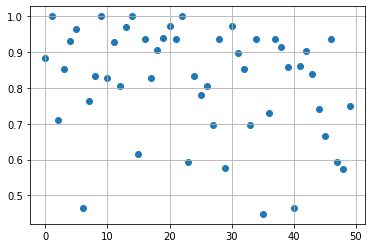

In [ ]:
data_loader=  DataLoader(ESC50(X_train, y_train, aug_chance= 0, transform_type= 'S', n_mfcc= 40), batch_size= 32, shuffle= True)
with torch.no_grad():
  y_check= np.zeros(50)
  y_count= np.zeros(50)
  for x, y in data_loader:
    x= x.to(device)
    y_pred=  torch.argmax(model(x), dim=1)

    for idx, item in enumerate(y):
      y_count[item]+=1
      if item== y_pred[idx]:
        y_check[item]+= 1
y_check/y_count

plt.scatter(np.arange(0, 50), y_check/y_count)
plt.grid()
plt.show()

Классы 6, 15, 29, 24, 40, 35, 48, 47 имеет довольно низкую метрику.

48, 47, 45, 40, 35 - такие класссы были в MS

In [ ]:
class LogLossSpecial(nn.Module):
  def __init__(self, class_indexes):
    super().__init__()
    self.class_indexes= class_indexes

  def forward(self, y_pred, y_true):
    loss= 0
    for idx in range(len(y_true)):
      if y_true[idx] in self.class_indexes:
        loss-= 5*torch.log(y_pred[idx, y_true[idx]]+0.0001)
      else:
        loss-= torch.log(y_pred[idx, y_true[idx]]+0.0001)
    return loss/len(y_true)


In [ ]:
lr= 1E-4
max_epoch= 5

#criterion= nn.CrossEntropyLoss()
criterion= LogLossSpecial([6, 15, 29, 24, 40, 35, 48, 47])
#metric= multiclass_recall
metric= accuracy


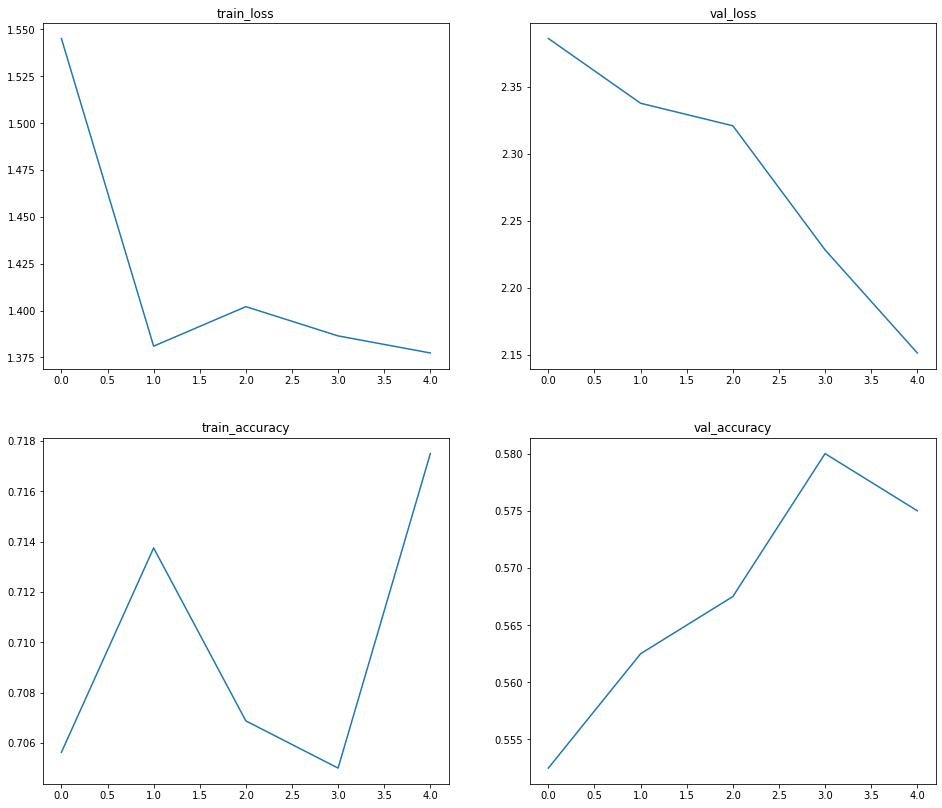

In [ ]:
train_metric, val_metric, train_loss, val_loss= train(model= model, optimizer= optimizer, criterion=criterion, max_epoch= max_epoch, metric= metric, train_data_loader= train_data_loader,
       val_data_loader= val_data_loader, scheduler= scheduler, device= device,  batch_size= 16, random_state= 42)

In [ ]:
torch.save(model.state_dict(), '/content/S35.pt')

[Веса тут](https://drive.google.com/file/d/1-6Bq0E4sk7u5iPpz-Szp_B9R2Ho-DXB3/view?usp=share_link)

In [ ]:
val_metric[-1]

tensor(0.5750)

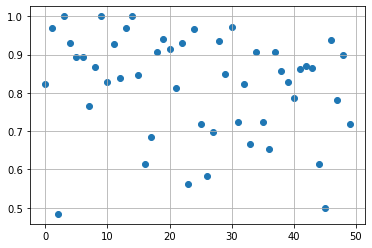

In [ ]:
data_loader=  DataLoader(ESC50(X_train, y_train, aug_chance= 0, transform_type= 'S', n_mfcc= 40), batch_size= 32, shuffle= True)
with torch.no_grad():
  y_check= np.zeros(50)
  y_count= np.zeros(50)
  for x, y in data_loader:
    x= x.to(device)
    y_pred=  torch.argmax(model(x), dim=1)

    for idx, item in enumerate(y):
      y_count[item]+=1
      if item== y_pred[idx]:
        y_check[item]+= 1
y_check/y_count

plt.scatter(np.arange(0, 50), y_check/y_count)
plt.grid()
plt.show()

### Выводы

* В данной работе была рассмотрена классификация аудиодорожек датасета ESC50, содержащий 40 объектов для каждого из 50 классов.

* Данные были рассмотрены при помощи трех спектральных представлений: Spectrogram, Mel Spectrogram, Mel Frequency Cepstral Coefficients, которые представляют из себя спектрограммы в разных шкалах.

* К дискритизированным аудиосигналам была применены класические методы аугментации Time Shift , Pitch Shift , Add Noise , TimeStretch, VolumeGainRange, что позволило сильно снизить вероятность переобучения модели.

* Звуковой сигнал с частотой дискритизации sr= 44100 был преобразован в MS, S и MFCC представления с постоянными параметрами n_fft= 4410, hop_lenght= 308;n_mels= 128 и n_mfcc= 40 для MS и MFCC соответственно.


* При использовании MS, S VGG16 показала сравнительно хорошие результаты accuracy, равное 0.66 и 0.58 соответственно, в отличие от MFCC с accuracy 0.4425, у MS и S близкие часты лежат рядом с друг-другом, и использовании аугментации, описанных выше, на дискритизированном не сильно меняет их вид, что позволяет модели лучше обучится. MFCC - это не спектрограммы (частота-время), а "кепстрограммы" (время-кепструм). MFCC является не очень хорошим представлением для типичных 2D CNN, которые применяются к спектрограммам. В MFCC частоты,ранее близкие друг к другу, больше не находятся рядом друг с другом по вертикальной оси. Поскольку 2D CNN имеют ядра с ограниченной размером (3*3) это затрудняет сбор пространственной информации. Совокупность этих факторов вместе с влияния метрики от тестовой части могут объяснить такое небольшое значение метрики.

* Accuracy равное 0.66 уступает значению данной метрике для аналогичной модели в [An Ensemble of Convolutional Neural Networks for Audio Classification](https://https://arxiv.org/abs/2007.07966v2)
. Это может быть связано с особенностями тестовой выборки, большим числом регуляризаций, используемых автором и более качественным выбором гиперпараметров.


### Основные виды улучшения

* В работе было рассмотрено всего 3 различных "времено-спектральных" представлений: MS, MFCC, S; но существуют и иные, нередко используемые варианты: GA, CO; которые также можно рассмотреть в будущем.

  ***Gammatone (GA) band-pass filters***

  Это набор фильтров GA, полоса пропускания которых увеличивается с
  увеличением центральной частоты. Функциональная форма гамматона основана на реакции
  мембраны улитки во внутреннем ухе слуховой системы человека. Импульсная характеристика
  гамматонового фильтра является произведением гамма распредления и синусоидального
  тона несущей.

  $$\begin{equation*}
  h_i(t) =
  \begin{cases}
    a t^{n-1} e^{-2\pi B_i t} cos(2\pi w_i t+\phi) &\text{$t \geq  0$}\\
    0 &\text{$t < 0 $}
  \end{cases}
  \end{equation*}$$

  $w_i$ -центральная частота, $B_i$ -фильтр, $\phi$ -фаза.

  ***Cochleagram (CO)***

  Модель преобразования связана с идеей о восприятии звука улиткой человека.
  Чтобы извлечь кохлеограмму, сначала необходимо отфильтровать исходный сигнал с
  помощью блока фильтров гамматона (см. "Gammatone (GA) band-pass filters" выше). Затем отфильтрованный сигнал должен быть разделен на перекрывающиеся окна. Для
  каждого окна и каждой частоты вычисляется энергия сигнала.

* Были рассмотрены основные классические виды регуляризаций звука: Time Shift ,
Pitch Shift ,
Add Noise , TimeStretch,
VolumeGainRange. Но существуют и другие виды: Short Signal Augmentation, Super Signal Augmentation, Time Scale Modification, Short Spectrogram Augmentation и тд. [См. подробнее.](https://arxiv.org/abs/2007.07966v2) Которые также можно было использовать для "увеличения данных" и еще больше снизить вероятность переобучения модели.

* Была рассмотрена лишь одна модель- VGG16 заранее не предообученная на дополнительных данных. При этом существует множество работ с другими моделями в которых достигается высокая точность. Но большие из таких моделей используют AudioSet для предтренировки:

  [Efficient End-to-End Audio Embeddings Generation for Audio Classification on Target Applications](https://ieeexplore.ieee.org/document/9414229)

  [Environmental Sound Classification on the Edge: A Pipeline for Deep
  Acoustic Networks on Extremely Resource-Constrained Devices](https://arxiv.org/ftp/arxiv/papers/2103/2103.03483.pdf)

  [KNOWLEDGE TRANSFER FROM WEAKLY LABELED AUDIO USING CONVOLUTIONAL
  NEURAL NETWORK FOR SOUND EVENTS AND SCENES](https://arxiv.org/pdf/1711.01369.pdf)

  Можно рассмотреть больше моделей, и использовать дополнительные данные в виде, например, AudioSet.

* Большая часть гиперпараметров подбиралась при аналитическом анализе ранней стадии обучения модели на малом числе эпох, чтобы отсеить совсем плохие случаи. Более аккуратный подбор параметров, например с помощью GridSearch или RandomSearch позволит улучшить полученный результат.

### Используемые статьи

[An Ensemble of Convolutional Neural Networks for Audio Classification](https://https://arxiv.org/abs/2007.07966v2)

[Fine-Tuning ResNet-18 for Audio Classification](https://wandb.ai/jhartquist/fastaudio-esc-50/reports/Fine-Tuning-ResNet-18-for-Audio-Classification--VmlldzoyOTAyMzc)


[Pre-processing spectrogram parameters improve the accuracy of bioacoustic classification using convolutional neural networks](https://www.tandfonline.com/doi/abs/10.1080/09524622.2019.1606734)

[Environmental Sound Classification on the Edge: A Pipeline for Deep
Acoustic Networks on Extremely Resource-Constrained Devices](https://arxiv.org/ftp/arxiv/papers/2103/2103.03483.pdf)